In [1]:
%load_ext autoreload
%autoreload 2
from reward_relative.path_dict_seahorse import path_dictionary as path_dict
from reward_relative import utilities as ut
from reward_relative import plotUtils as pt
from reward_relative import spatial
from reward_relative import placeCellPlot
from reward_relative import dayData as dd
from reward_relative import behavior
import pickle
import dill
import numpy as np
import os 
import matplotlib.pyplot as plt
import TwoPUtils
import protter_functions as pf
from scipy.signal import medfilt
from matplotlib.lines import Line2D
import pandas as pd
import umap
import hdbscan
import importlib
import scipy.interpolate as interp
import protter_functions as pf

import protter_plot_functions as ppf
from hmmlearn import hmm
ppf = importlib.reload(ppf)
from protter_plot_functions import add_hover, add_color_selector, ColorSelector, ColorSelectorV2#, #add_selectors
from claude_test_space import add_selectors
from protter_plot_functions import TrialPlotLinker
import matplotlib.cm as cm
import seaborn as sns

plt.rcParams['svg.fonttype'] = 'none'

2026-08-13 16:00:16.710341: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-08-13 16:00:16.738130: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
import h5py
file_name = '/data/dave/sosa_data_h5/hdf5_conversion_v2'

f= h5py.File(file_name, "r")

In [3]:
f.keys()

<KeysViewHDF5 ['GCAMP11', 'GCAMP12', 'GCAMP13', 'GCAMP14', 'GCAMP15', 'GCAMP17', 'GCAMP18', 'GCAMP19', 'GCAMP3', 'GCAMP4', 'GCAMP7']>

In [ ]:
def load_multiple_day_lick_data(hd5_animal_obj, day_list = None):
    if day_list is None:
        day_list = sorted(hd5_animal_obj.keys(), key=int)
    dat = hd5_animal_obj[day_list[0]]['lick_data']['smoothed_licks']
    trial_dataframe = pf.recreate_trial_meta_df(hd5_animal_obj[day_list[0]]['trial_metadata'])
    for day in day_list[1:]:
        dat = np.concatenate([dat, hd5_animal_obj[day]['lick_data']['smoothed_licks']])
        trial_dataframe = pd.concat((trial_dataframe, pf.recreate_trial_meta_df(hd5_animal_obj[day]['trial_metadata'])) )
        dat = pd.DataFrame()
    
    return dat, trial_dataframe


In [6]:
# all_day_licks, all_day_df = load_multiple_day_lick_data(f['GCAMP14'])

animal_list = list(f.keys())
all_day_licks, all_day_df = load_multiple_day_lick_data(f[animal_list[0]])
all_day_df['animal'] = animal_list[0]

for animal in animal_list[1:]:
    ani_lick, ani_all_day_df = load_multiple_day_lick_data(f[animal])
    ani_all_day_df['animal'] = animal

    all_day_licks = np.concatenate([all_day_licks, ani_lick])
    all_day_df = pd.concat([all_day_df, ani_all_day_df])



nan_slicer = np.logical_not(np.isnan(all_day_licks).any(axis = 1))
all_day_df = all_day_df.loc[nan_slicer]
all_day_licks = all_day_licks[nan_slicer]


In [127]:
sorted_features, sorted_meta, sorted_licks = pf.generate_cross_day_features(all_day_licks, 
                                                                    all_day_df, 
                                                                    bin_centers[:], norm = False, 
                                                                    reward_relative=True
                                                                    )

In [128]:
sorted_features.shape

(6222, 12)

In [129]:
%matplotlib widget
import protter_plot_functions as ppf
ppf = importlib.reload(ppf)
from protter_plot_functions import add_hover, add_color_selector, ColorSelector, ColorSelectorV2#, #add_selectors
from claude_test_space import add_selectors
from protter_plot_functions import TrialPlotLinker
pf = importlib.reload(pf)

bin_centers = np.arange(5,455,10)

# display_slicer = (trials_na_free.animal == 'GCAMP12')&(trials_na_free.day == 14)


# display_slicer = (trials_na_free.trial_type == 'post_swap')
# display_slicer = [True]*len(licks_na_free)


# licks = all_day_licks
# lick_bins = f[animal][day]['lick_data']['bin_center'][:]
# metadata = all_day_df.copy()
# zones = pf.default_zones


# features= pf.generate_features_from_zone_list(licks, bin_centers, zones, norm = False,  )
# feats = features[[c for c in features.columns if not c in [ 'n_licks', ]]]
# feats = features
# feats = np.nan_to_num(feats)

licks = sorted_licks
lick_bins = f[animal][day]['lick_data']['bin_center'][:]
metadata = sorted_meta.copy()
feats = sorted_features[[c for c in sorted_features.columns if not c in [ 'n_licks', ]]]




# feats = all_day_licks

# n_neighbors = max([int(len(licks)/22),10])
n_neighbors = 25
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=0.05, metric = 'canberra')

transform = reducer.fit_transform(feats)


# lick_pca = skd.PCA()
# transform = lick_pca.fit_transform(feats[:,1:])

min_samples = 2
min_cluster_size = 10
# hdb_data = feats
hdb_data = transform
new_labels = hdbscan.HDBSCAN(
    min_samples=min_samples,
    min_cluster_size=min_cluster_size,
    metric = 'canberra',
    cluster_selection_method = 'leaf',
    cluster_selection_epsilon=0.01,
    

).fit_predict(hdb_data)


# from claude_test_space import kernel_distance_matrix, gaussian_bin_kernel
# K = gaussian_bin_kernel(n_bins=45, bin_width=10, sigma=30, circular=True)
# D = kernel_distance_matrix(licks, kernel=K)

# new_labels = hdbscan.HDBSCAN(metric='precomputed', cluster_selection_method = "leaf",min_cluster_size=5, min_samples=3).fit_predict(D)

# metadata = all_day_df.copy()
metadata['hdb_labels'] = new_labels





pct unlabeled = 3.3269045323047255


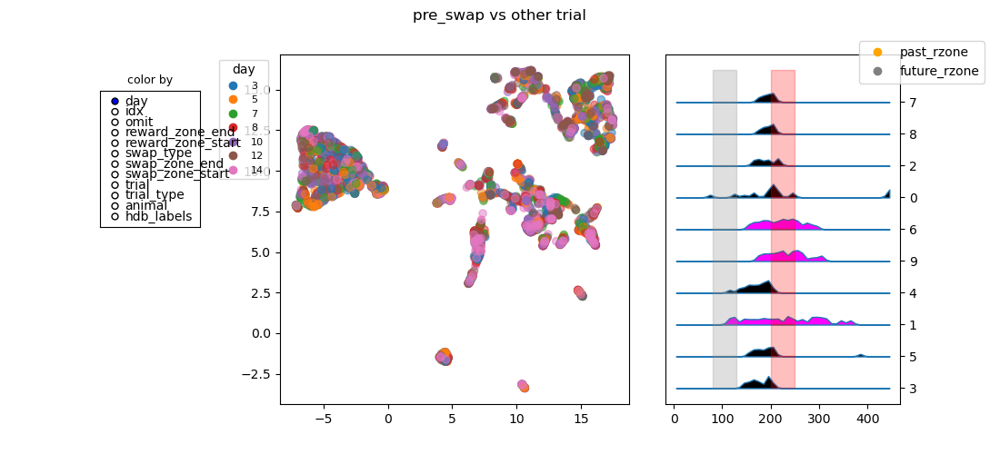

In [130]:
scatter_meta = metadata
scatter_data = transform
linker = TrialPlotLinker(metadata)
raster_data = licks

bin_centers = f[animal][day]['lick_data']['bin_center']

fig = plt.figure(figsize = (11,5))
fig.suptitle('pre_swap vs other trial')
axes_dict = fig.subplot_mosaic([['lick_umap', 'lick_umap', 'lick_raster'],
                                    ['lick_umap','lick_umap', 'lick_raster'],
                                    ],
                                height_ratios = [3.0,2.0],
                                width_ratios = [2.0,2.0,3])

ax_umap= axes_dict['lick_umap']




scatter_1 = ax_umap.scatter(scatter_data[:,0], scatter_data[:,1], alpha = 0.5, label = 'preswap')

ax_umap.legend()


add_hover(scatter_1, scatter_meta)
color_selector = ColorSelectorV2(scatter_1,scatter_meta)

sel = add_selectors(scatter_1, linker, scatter_meta)


umap_view = ppf.ScatterView(data = transform, meta = scatter_meta, plt_obj = scatter_1)


lick_ax = axes_dict['lick_raster']
lick_ax.tick_params(right=True, labelright=True, left=False, labelleft=False)

raster_view = ppf.LickRasterView(raster_data, bin_centers, scatter_meta, lick_ax)
raster_view.link_colormaps(color_selector.get_color_linker(), )
raster_view.sort_by({'hdb_labels':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
# raster_view.sort_by({'hdb_labels':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
color_selector.add_after_recolor_call(raster_view.update_linked_colors)

linker.add_views([umap_view, raster_view]) 
# raster_view.update(start_idx)
# umap_view.update(start_idx)
print(f'pct unlabeled = {100*(sum(new_labels == -1)/len(new_labels))}')
  

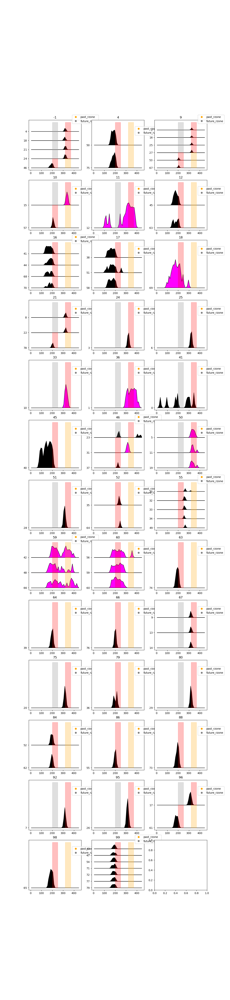

In [131]:


animal = 'GCAMP14'
day = '10'

hd5_df = pf.recreate_trial_meta_df(f[animal][day]['trial_metadata'])

label_column = 'hdb_labels'


animal_slice =  metadata.loc[metadata.idx.isin( hd5_df.idx).values]

labels = animal_slice[label_column].unique()

ncols = 3
nrows = int(np.ceil(len(labels)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (4*ncols, 4*nrows))

for ax, label in zip(axs.ravel(), sorted(labels)):
    hd5_df_from_label = animal_slice.loc[animal_slice.idx.isin(animal_slice.loc[animal_slice[label_column] == label, 'idx'])] 

    lick_from_label = pf.get_data_trials_by_idx(data = f[animal][day]['lick_data']['smoothed_licks'][:], 
                                                data_meta_df = animal_slice, 
                                                idx_list = hd5_df_from_label.idx.values)
    if len(hd5_df_from_label) == 1:
        lick_from_label = [lick_from_label]
    ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, ax)
    ax.set_title(label)

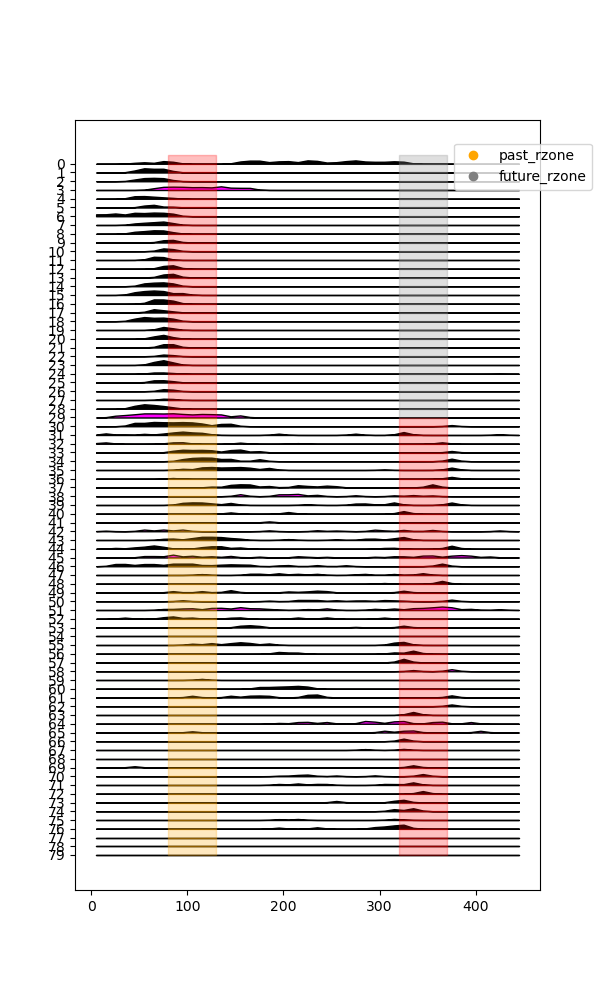

In [98]:

a = 'GCAMP4'
d = '5'

df = pf.recreate_trial_meta_df(f[a][d]['trial_metadata'])





fig, ax = plt.subplots(figsize = (6, 10))
ppf.plot_raster_from_licks(f[a][d]['lick_data']['smoothed_licks'][[i for i in range(len(df))]], df, ax)
# plot_raster_from_licks(f[animal][day]['lick_data']['smoothed_licks'][[9,10,29,30,34,35,55]], df.iloc[[9,10,29,30,34,35,55]], ax)

In [26]:

# 8 components


# lets make our states [accurate A, accurate B, accurate C, a+b, a+c, b+c, all, other ]

initializer_transition = np.zeros((8,8))
within_day_z1_to_z2 = 0.5
within_day_z1_and_z2 = 0.3
for i in range(3):
    for j in range(3):
        if i == j:
            initializer_transition[i,j] = 0.6
        else:
            initializer_transition[i,j] = 0.1

for i in range(3):
    
    for j in range(3, 7, 1):
        initializer_transition[i,j] = 0.04
        initializer_transition[j,i] = 0.1
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]

#other
for i in range(3, 7, 1):
    initializer_transition[-1, i] = 0.1
    for j in range(3, 7, 1):
        initializer_transition[j,i] = 0.1
#lower
for i in range(3, 7, 1):
    
    for j in range(3, 7, 1):
        if i == j:
            initializer_transition[i,j] = 0.3
        else:
            initializer_transition[i,j] = 0.125
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]


initializer_transition[-1,:] = 1/8


start_prob = np.zeros((8))
start_prob[:3] = 0.2
start_prob[3:-1] = 0.075
start_prob[-1] = 1 - start_prob.sum()




In [134]:

# 10 components


# lets make our conception of states for initialization:
#  [accurate A, accurate B, accurate C, a+b, a+c, b+c, up to b, after b, all, other ]

initializer_transition = np.zeros((10,10))

for i in range(3):
    for j in range(3):
        if i == j:
            initializer_transition[i,j] = 0.4
        else:
            initializer_transition[i,j] = 0.1

for i in range(3):
    
    for j in range(3, 9, 1):
        initializer_transition[i,j] = 0.04
        initializer_transition[j,i] = 0.1
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]

#other
for i in range(3, 9, 1):
    initializer_transition[-1, i] = 0.1
    for j in range(3, 9, 1):
        initializer_transition[j,i] = 0.1
#lower
for i in range(3, 9, 1):
    
    for j in range(3, 9, 1):
        if i == j:
            initializer_transition[i,j] = 0.2
        else:
            initializer_transition[i,j] = 0.08
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]


initializer_transition[-1,:] = 1/initializer_transition.shape[1]
start_prob = np.zeros((10))
start_prob[:3] = 0.2
start_prob[3:-1] = 0.05
start_prob[-1] = 1 - start_prob.sum()



In [81]:
initializer_transition

array([[0.4 , 0.1 , 0.1 , 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.16],
       [0.1 , 0.4 , 0.1 , 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.16],
       [0.1 , 0.1 , 0.4 , 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.16],
       [0.1 , 0.1 , 0.1 , 0.2 , 0.08, 0.08, 0.08, 0.08, 0.08, 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.08, 0.2 , 0.08, 0.08, 0.08, 0.08, 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.08, 0.08, 0.2 , 0.08, 0.08, 0.08, 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.08, 0.08, 0.08, 0.2 , 0.08, 0.08, 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.08, 0.08, 0.08, 0.08, 0.2 , 0.08, 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.08, 0.08, 0.08, 0.08, 0.08, 0.2 , 0.1 ],
       [0.1 , 0.1 , 0.1 , 0.1 , 0.1 , 0.1 , 0.1 , 0.1 , 0.1 , 0.1 ]])

In [132]:

# 11 components


# lets make our states [accurate A, accurate B, accurate C, a+b, a+c, b+c, up to b, after b, all, other ]

initializer_transition = np.zeros((11,11))

for i in range(3):
    for j in range(3):
        if i == j:
            initializer_transition[i,j] = 0.4
        else:
            initializer_transition[i,j] = 0.1

for i in range(3):
    
    for j in range(3, 10, 1):
        initializer_transition[i,j] = 0.04
        initializer_transition[j,i] = 0.1
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]

#other
for i in range(3, 10, 1):
    initializer_transition[-1, i] = 0.1
    for j in range(3, 7, 1):
        initializer_transition[j,i] = 0.1
#lower
for i in range(3, 10, 1):
    
    for j in range(3, 10, 1):
        if i == j:
            initializer_transition[i,j] = 0.2
        else:
            initializer_transition[i,j] = 0.08
    initializer_transition[i,-1] = 1 - initializer_transition.sum(axis = 1)[i]


initializer_transition[-1,:] = 1/initializer_transition.shape[1]




In [30]:
print(initializer_transition)

[[0.4        0.1        0.1        0.04       0.04       0.04
  0.04       0.04       0.04       0.04       0.12      ]
 [0.1        0.4        0.1        0.04       0.04       0.04
  0.04       0.04       0.04       0.04       0.12      ]
 [0.1        0.1        0.4        0.04       0.04       0.04
  0.04       0.04       0.04       0.04       0.12      ]
 [0.1        0.1        0.1        0.2        0.08       0.08
  0.08       0.08       0.08       0.08       0.02      ]
 [0.1        0.1        0.1        0.08       0.2        0.08
  0.08       0.08       0.08       0.08       0.02      ]
 [0.1        0.1        0.1        0.08       0.08       0.2
  0.08       0.08       0.08       0.08       0.02      ]
 [0.1        0.1        0.1        0.08       0.08       0.08
  0.2        0.08       0.08       0.08       0.02      ]
 [0.1        0.1        0.1        0.08       0.08       0.08
  0.08       0.2        0.08       0.08       0.02      ]
 [0.1        0.1        0.1        0.08  

In [135]:
initializer_transition.shape

(10, 10)

In [136]:
np.random.seed(5)
remodel = hmm.GaussianHMM(n_components=initializer_transition.shape[0], init_params='mc', n_iter = 200)
remodel.trans_mat_ = initializer_transition
remodel.startprob_ = start_prob

licks = sorted_licks
lick_bins = f[animal][day]['lick_data']['bin_center'][:]
metadata = sorted_meta.copy()
feats = sorted_features[[c for c in sorted_features.columns if not c in [ 'n_licks', ]]]

X = feats

remodel.fit(X)



Z2 = remodel.predict(X)
metadata = sorted_meta.copy()
metadata['HMM_label'] = Z2

Model is not converging.  Current: 73535.99688071001 is not greater than 73536.02207700851. Delta is -0.02519629850576166


pct unlabeled = 3.3269045323047255


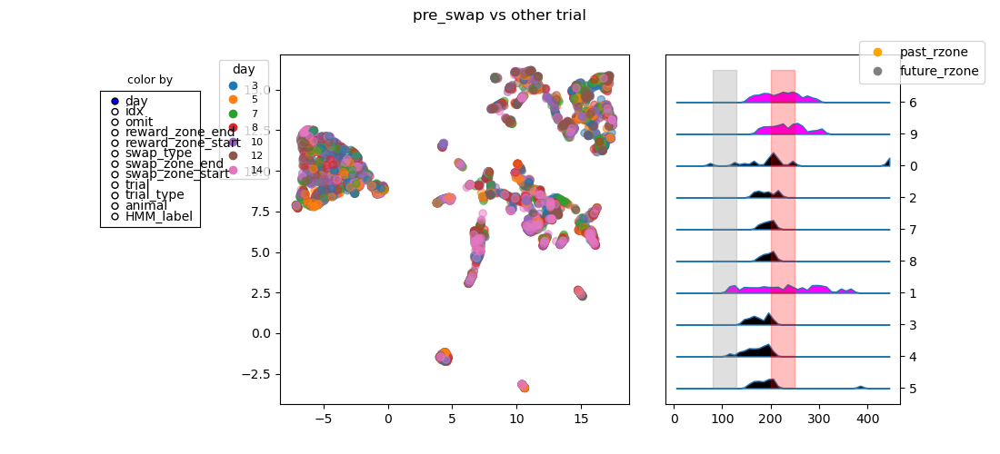

In [137]:
scatter_meta = metadata
scatter_data = transform
linker = TrialPlotLinker(metadata)
raster_data = all_day_licks

bin_centers = f[animal][day]['lick_data']['bin_center']

fig = plt.figure(figsize = (11,5))
fig.suptitle('pre_swap vs other trial')
axes_dict = fig.subplot_mosaic([['lick_umap', 'lick_umap', 'lick_raster'],
                                    ['lick_umap','lick_umap', 'lick_raster'],
                                    ],
                                height_ratios = [3.0,2.0],
                                width_ratios = [2.0,2.0,3])

ax_umap= axes_dict['lick_umap']




scatter_1 = ax_umap.scatter(scatter_data[:,0], scatter_data[:,1], alpha = 0.5, label = 'preswap')

ax_umap.legend()


add_hover(scatter_1, scatter_meta)
color_selector = ColorSelectorV2(scatter_1,scatter_meta)

sel = add_selectors(scatter_1, linker, scatter_meta)


umap_view = ppf.ScatterView(data = transform, meta = scatter_meta, plt_obj = scatter_1)


lick_ax = axes_dict['lick_raster']
lick_ax.tick_params(right=True, labelright=True, left=False, labelleft=False)

raster_view = ppf.LickRasterView(raster_data, bin_centers, scatter_meta, lick_ax)
raster_view.link_colormaps(color_selector.get_color_linker(), )
raster_view.sort_by({'HMM_label':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
# raster_view.sort_by({'hdb_labels':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
color_selector.add_after_recolor_call(raster_view.update_linked_colors)

linker.add_views([umap_view, raster_view]) 
# raster_view.update(start_idx)
# umap_view.update(start_idx)
print(f'pct unlabeled = {100*(sum(new_labels == -1)/len(new_labels))}')

In [66]:
np.median((all_day_licks == 0).sum(axis = 1))

28.0

In [ ]:
# metadata.to_csv('all_non_na_licks_with_hmm_labels.csv')


In [ ]:
# metadata_hmm = pd.read_csv('all_non_na_licks_with_hmm_labels.csv')



In [36]:
animal = 'GCAMP14'
day = '5'

hd5_df = pf.recreate_trial_meta_df(f[animal][day]['trial_metadata'])




In [37]:
# fig, ax = plt.subplots(figsize = (3, 8))

# v = ppf.plot_raster_from_licks(licks, 
#                        hd5_df,ax = ax )


In [38]:
from claude_hmm_support import group_transition_matrix, group_start_prob, describe
n_components = 10
groups = {'day_pair':[0,1], 'other_z':[2], 'day_both':[3], 'day_other':[4,5], 'other':list(range(6, n_components))}
self_weights = {'day_pair':10,'other_z':2,'day_both':3, 'day_other':1, 'other':0.5}
aff = {
    ('day_pair','day_pair'):    8,     # states 0,1 -> states 0,1
    ('day_pair','day_both'):  5,     # states 0,1 -> state 2
    ('day_both','day_pair'):  5,     # state 2 -> states 0,1
    ('day_pair','other_z'): 0.5,
    ('day_other','other'):   0.5,
}
A  = group_transition_matrix(10, groups, aff, self_weight=self_weights)
pi = group_start_prob(10, groups, {'day_pair':0.6,'day_both':0.2,'other':0.2})


In [39]:
describe(A, groups)

0:day_pair    0.339 0.271 0.017 0.169 0.034 0.034 0.034 0.034 0.034 0.034
1:day_pair    0.271 0.339 0.017 0.169 0.034 0.034 0.034 0.034 0.034 0.034
2:other_z     0.091 0.091 0.182 0.091 0.091 0.091 0.091 0.091 0.091 0.091
3:day_both    0.250 0.250 0.050 0.150 0.050 0.050 0.050 0.050 0.050 0.050
4:day_other   0.125 0.125 0.125 0.125 0.125 0.125 0.062 0.062 0.062 0.062
5:day_other   0.125 0.125 0.125 0.125 0.125 0.125 0.062 0.062 0.062 0.062
6:other       0.105 0.105 0.105 0.105 0.105 0.105 0.053 0.105 0.105 0.105
7:other       0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.053 0.105 0.105
8:other       0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.053 0.105
9:other       0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.105 0.053


In [40]:
from claude_hmm_support import diagnose_poisson_input

diagnose_poisson_input(X)

{'shape': (6222, 45),
 'dtype': 'float64',
 'has_nan': False,
 'has_inf': False,
 'has_negative': False,
 'is_integer_valued': False,
 'min': 0.0,
 'max': 4.946510748930467,
 'overall_zero_fraction': 0.5739419264973749,
 'all_zero_columns': [],
 'risky_columns': [],
 'max_column_zero_fraction': 0.8524590163934426}

In [41]:
features= pf.generate_features_from_zone_list(licks, bin_centers, zones, norm = False,  )
feats = features[[c for c in features.columns if not c in [ 'n_licks', ]]]

In [68]:
np.log1p(all_day_licks)

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        2.26144498e-04, 8.75251265e-02, 5.68403915e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.69751806e-01, 8.60217293e-01, 1.69365691e-01, ...,
        2.73804819e-01, 4.16987065e-02, 1.05540464e-04],
       [0.00000000e+00, 0.00000000e+00, 2.63830276e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

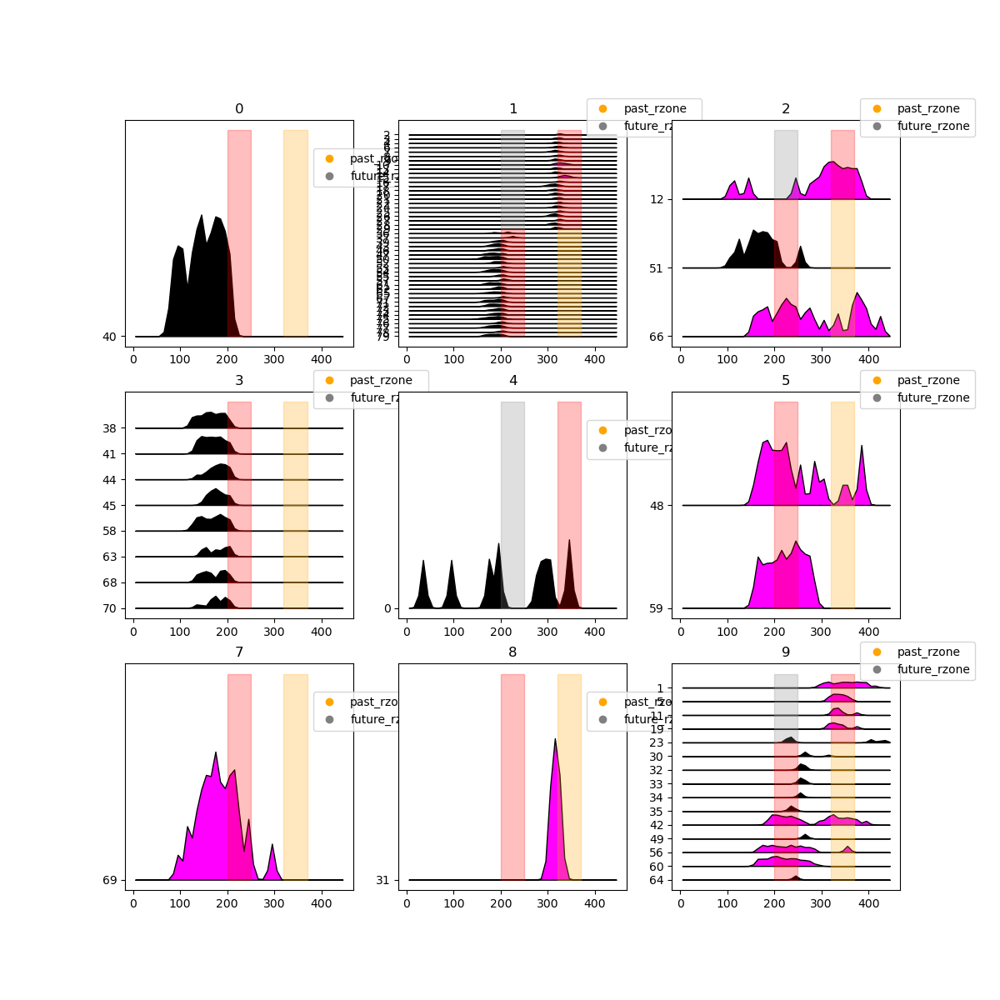

In [140]:
np.random.seed(100)

animal = 'GCAMP14'
day = '10'

hd5_df = pf.recreate_trial_meta_df(f[animal][day]['trial_metadata'])



licks = sorted_licks
lick_bins = f[animal][day]['lick_data']['bin_center'][:]
metadata = sorted_meta.copy()
feats = sorted_features[[c for c in sorted_features.columns if not c in [ 'n_licks', ]]]

X = feats
# X = np.nan_to_num(feats.values)
metadata = all_day_df.copy()

model = hmm.GaussianHMM(n_components=10,
                        init_params='mc', params='stmc', covariance_type='full')


# model = hmm.PoissonHMM(n_components=10, init_params='l', params='stl', n_iter=200)
# X = (X*100).astype(int)
# model.transmat_, model.startprob_ = initializer_transition, start_prob
# model.transmat_, model.startprob_ = A, pi

model.fit(X)



Z2 = model.predict(X)

metadata['HMM_label'] = Z2


animal_slice =  metadata.iloc[metadata.idx.isin( hd5_df.idx).values]

labels = animal_slice.HMM_label.unique()

ncols = 3
nrows = int(np.ceil(len(labels)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (4*ncols, 4*nrows))

for ax, label in zip(axs.ravel(), sorted(labels)):
    hd5_df_from_label = animal_slice.loc[animal_slice.idx.isin(animal_slice.loc[animal_slice.HMM_label == label, 'idx'])] 
    lick_from_label = pf.get_data_trials_by_idx(f[animal][day]['lick_data']['smoothed_licks'][:], animal_slice, animal_slice.loc[animal_slice.HMM_label == label, 'idx'])
    if len(hd5_df_from_label) == 1:
        lick_from_label = [lick_from_label]
    ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, ax)
    ax.set_title(label)

In [45]:
from claude_hmm_support import fit_lick_motifs

model, weights, motifs = fit_lick_motifs(all_day_licks, n_components=12)

In [46]:
pf.default_zones

[Zone(name='A', start=80, end=130, anticipatory_distance=50, post_zone_distance=15),
 Zone(name='B', start=200, end=250, anticipatory_distance=50, post_zone_distance=15),
 Zone(name='C', start=320, end=370, anticipatory_distance=50, post_zone_distance=15)]

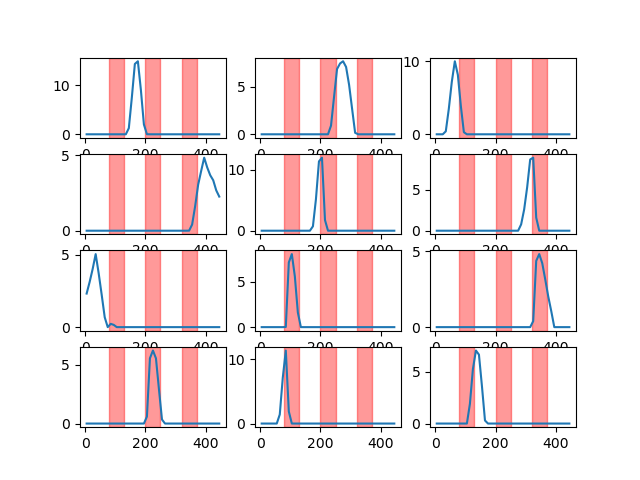

In [47]:
fig, axs = plt.subplots(ncols = 3, nrows = 4)
for motif, ax in zip(motifs, axs.ravel()):
    ax.plot(bin_centers[:], motif)
    for xmin, xmax in zip([80,200,320], [130, 250, 370]):
        ax.axvspan(xmin=xmin, xmax = xmax, color = 'red', alpha = 0.4)
    

In [48]:
reconstruction = weights @ motifs

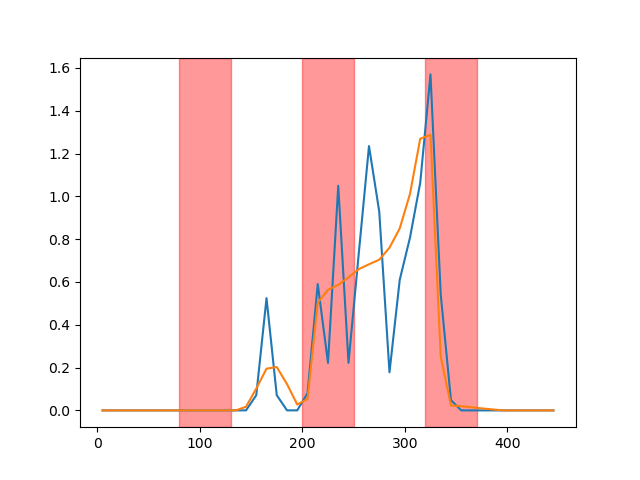

In [49]:
fig, ax = plt.subplots()
trial = 150
ax.plot(bin_centers[:],all_day_licks[trial,:])
ax.plot(bin_centers[:],reconstruction[trial,:])
for xmin, xmax in zip([80,200,320], [130, 250, 370]):
        ax.axvspan(xmin=xmin, xmax = xmax, color = 'red', alpha = 0.4)

In [60]:
X

array([[ 0,  0,  0, ...,  0,  0,  7],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 1, 13,  1, ...,  3,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]])

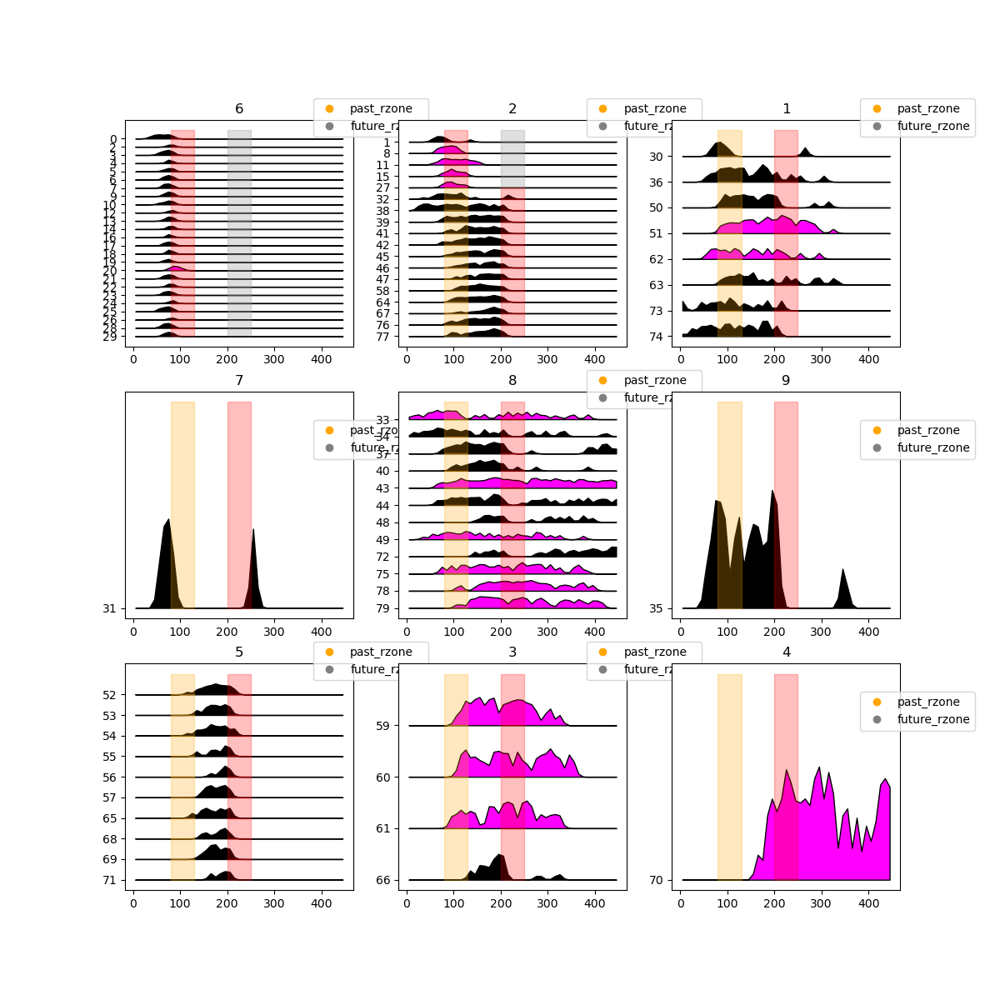

In [61]:
np.random.seed(8)

model = hmm.GaussianHMM(n_components=10, covariance_type='diag',
                        init_params='mc', params='smc', min_covar=1e-2)
K = 10
X = all_day_licks


# model = hmm.PoissonHMM(n_components=K, init_params='l', params='sl')
# X = (X*10).astype(int)



model.transmat_ = np.full((K, K), 1.0 / K)
model.startprob_ = np.full(K, 1.0 / K)


metadata = all_day_df.copy()


model.fit(X )



Z2 = model.predict(X)

metadata['HMM_label'] = Z2

metadata_hmm = metadata

hd5_df =  metadata_hmm.iloc[np.where(metadata_hmm.idx.isin( hd5_df.idx))]

metadata = hd5_df
labels = hd5_df.HMM_label.unique()

ncols = 3
nrows = int(np.ceil(len(labels)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (4*ncols, 4*nrows))

for ax, label in zip(axs.ravel(), labels):
    hd5_df_from_label = hd5_df.loc[hd5_df.idx.isin(hd5_df.loc[hd5_df.HMM_label == label, 'idx'])] 
    lick_from_label = pf.get_data_trials_by_idx(f[animal][day]['lick_data']['smoothed_licks'][:], hd5_df, hd5_df.loc[hd5_df.HMM_label == label, 'idx'])
    if len(hd5_df_from_label) == 1:
        lick_from_label = [lick_from_label]
    ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, ax)
    ax.set_title(label)

In [437]:
np.where(metadata_hmm.idx.isin( hd5_df.idx))

(array([1758, 1759, 1760, 1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768,
        1769, 1770, 1771, 1772, 1773, 1774, 1775, 1776, 1777, 1778, 1779,
        1780, 1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790,
        1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801,
        1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812,
        1813, 1814, 1815, 1816, 1817, 1818, 1819, 1820, 1821, 1822, 1823,
        1824, 1825, 1826, 1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834,
        1835, 1836, 1837]),)

In [443]:
np.where(metadata_hmm.idx.isin( hd5_df.idx))

(array([1758, 1759, 1760, 1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768,
        1769, 1770, 1771, 1772, 1773, 1774, 1775, 1776, 1777, 1778, 1779,
        1780, 1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790,
        1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801,
        1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812,
        1813, 1814, 1815, 1816, 1817, 1818, 1819, 1820, 1821, 1822, 1823,
        1824, 1825, 1826, 1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834,
        1835, 1836, 1837]),)

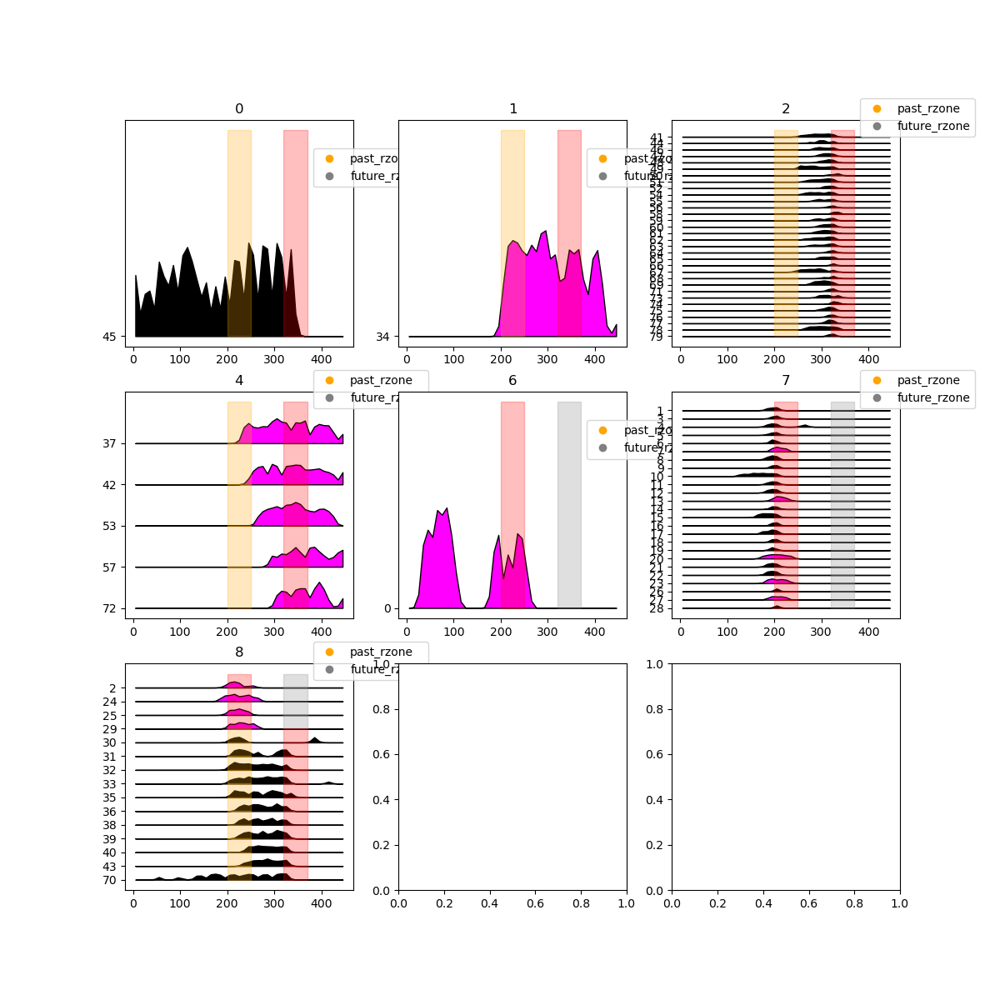

In [451]:
from claude_hmm_support import loadings_to_counts

np.random.seed(8)

X = loadings_to_counts(weights)
# X = np.nan_to_num(feats.values)
metadata = all_day_df.copy()

# model = hmm.GaussianHMM(n_components=10, covariance_type='diag',
#                         init_params='mc', params='stmc', min_covar=1e-2)


model = hmm.PoissonHMM(n_components=10, init_params='l', params='stl')
# X = (X*100).astype(int)
# model.transmat_, model.startprob_ = A, pi





model.fit(X)



Z2 = model.predict(X)

metadata['HMM_label'] = Z2

metadata_hmm = metadata

hd5_df =  metadata_hmm.iloc[np.where(metadata_hmm.idx.isin( hd5_df.idx))]

metadata = hd5_df
labels = hd5_df.HMM_label.unique()

ncols = 3
nrows = int(np.ceil(len(labels)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (4*ncols, 4*nrows))

for ax, label in zip(axs.ravel(), sorted(labels)):
    hd5_df_from_label = hd5_df.loc[hd5_df.idx.isin(hd5_df.loc[hd5_df.HMM_label == label, 'idx'])] 
    lick_from_label = pf.get_data_trials_by_idx(f[animal][day]['lick_data']['smoothed_licks'][:], hd5_df, hd5_df.loc[hd5_df.HMM_label == label, 'idx'])
    if len(hd5_df_from_label) == 1:
        lick_from_label = [lick_from_label]
    ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, ax)
    ax.set_title(label)

In [450]:
hd5_df

,day,idx,omit,reward_zone_end,reward_zone_start,swap_type,swap_zone_end,swap_zone_start,trial,trial_type,animal,HMM_label
0,5,GCAMP14_5_0,True,250,200,swap_distal,370.0,320.0,0,pre_swap,GCAMP14,8
1,5,GCAMP14_5_1,False,250,200,swap_distal,370.0,320.0,1,pre_swap,GCAMP14,1
2,5,GCAMP14_5_2,True,250,200,swap_distal,370.0,320.0,2,pre_swap,GCAMP14,4
3,5,GCAMP14_5_3,False,250,200,swap_distal,370.0,320.0,3,pre_swap,GCAMP14,1
4,5,GCAMP14_5_4,False,250,200,swap_distal,370.0,320.0,4,pre_swap,GCAMP14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
75,5,GCAMP14_5_75,False,370,320,swap_distal,250.0,200.0,75,post_swap,GCAMP14,9
76,5,GCAMP14_5_76,False,370,320,swap_distal,250.0,200.0,76,post_swap,GCAMP14,9
77,5,GCAMP14_5_77,False,370,320,swap_distal,250.0,200.0,77,post_swap,GCAMP14,9
78,5,GCAMP14_5_78,False,370,320,swap_distal,250.0,200.0,78,post_swap,GCAMP14,9


In [356]:
metadata_hmm.loc[metadata_hmm.trial.isin([30,31,32]).values]

,day,idx,omit,reward_zone_end,reward_zone_start,swap_type,swap_zone_end,swap_zone_start,trial,trial_type,animal,HMM_label
30,3,GCAMP11_3_30,False,130,80,swap_proximal,250.0,200.0,30,post_swap,GCAMP11,4
31,3,GCAMP11_3_31,False,130,80,swap_proximal,250.0,200.0,31,post_swap,GCAMP11,4
32,3,GCAMP11_3_32,False,130,80,swap_proximal,250.0,200.0,32,post_swap,GCAMP11,3
30,5,GCAMP11_5_30,False,370,320,swap_distal,130.0,80.0,30,post_swap,GCAMP11,7
31,5,GCAMP11_5_31,False,370,320,swap_distal,130.0,80.0,31,post_swap,GCAMP11,7
...,...,...,...,...,...,...,...,...,...,...,...,...
31,12,GCAMP7_12_31,True,130,80,swap_proximal,370.0,320.0,31,post_swap,GCAMP7,5
32,12,GCAMP7_12_32,False,130,80,swap_proximal,370.0,320.0,32,post_swap,GCAMP7,5
30,14,GCAMP7_14_30,False,250,200,swap_distal,130.0,80.0,30,post_swap,GCAMP7,7
31,14,GCAMP7_14_31,False,250,200,swap_distal,130.0,80.0,31,post_swap,GCAMP7,7


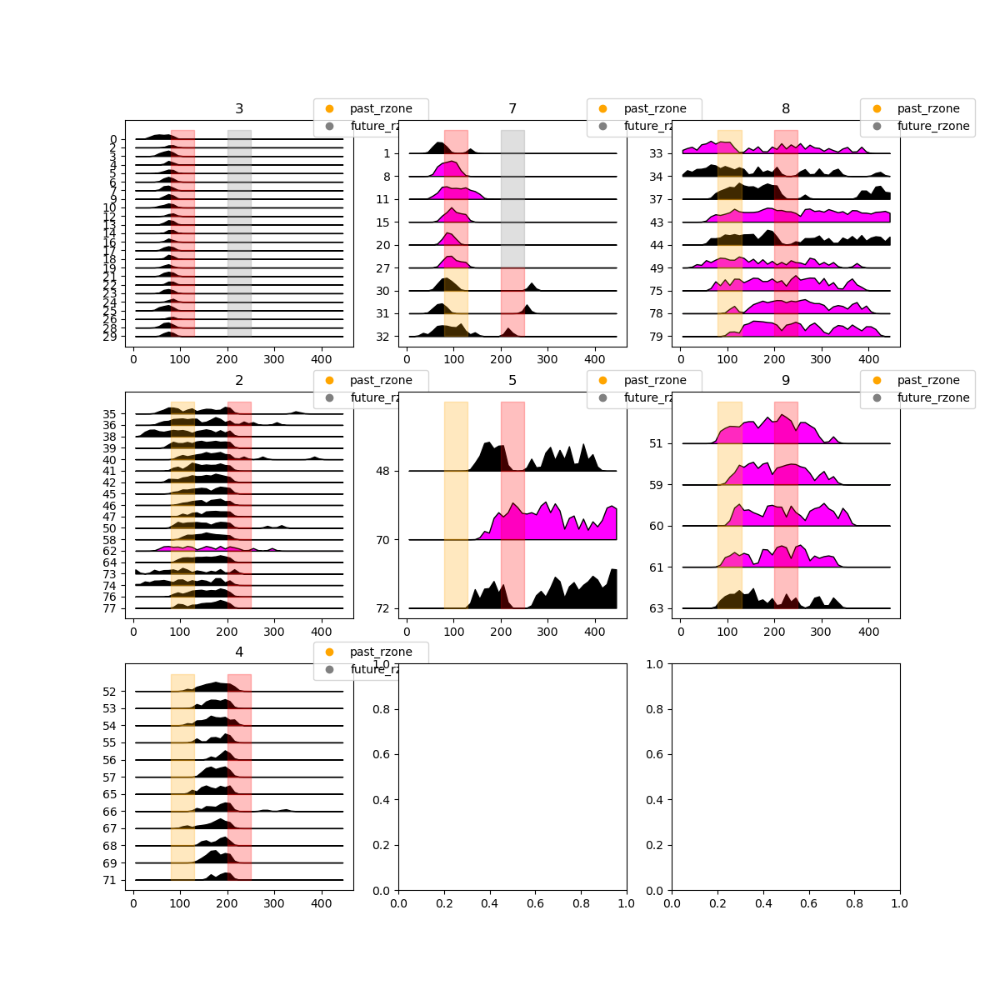

In [357]:
metadata = hd5_df
labels = hd5_df.HMM_label.unique()

ncols = 3
nrows = int(np.ceil(len(labels)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (4*ncols, 4*nrows))

for ax, label in zip(axs.ravel(), labels):
    hd5_df_from_label = hd5_df.loc[hd5_df.idx.isin(hd5_df.loc[hd5_df.HMM_label == label, 'idx'])] 
    lick_from_label = pf.get_data_trials_by_idx(f[animal][day]['lick_data']['smoothed_licks'][:], hd5_df, hd5_df.loc[hd5_df.HMM_label == label, 'idx'])
    if len(hd5_df_from_label) == 1:
        lick_from_label = [lick_from_label]
    ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, ax)
    ax.set_title(label)

In [141]:
label = 1
comp_label = 1

neural_trials_raw = f[animal][day]['neural_events_trial_matrix'][:]
neural_trials = pf.tm_zscore(neural_trials_raw)
hd5_df_from_label = hd5_df.loc[hd5_df.idx.isin(metadata.loc[metadata.hdb_labels == label, 'idx'])] 

pv_from_label = pf.get_data_trials_by_idx(neural_trials, hd5_df, 
                                       metadata.loc[metadata.hdb_labels == label, 'idx'])
lick_from_label = pf.get_data_trials_by_idx(licks, 
                                         hd5_df, metadata.loc[metadata.hdb_labels == label, 'idx'])

speeds_from_label = pf.get_data_trials_by_idx(f[animal][day]['speed']['speed'][:], 
                                         hd5_df, metadata.loc[metadata.hdb_labels == label, 'idx'])
speed_bins_from_label = f[animal][day]['speed']['bin_center'][:]

comp_hd5_df_from_label = hd5_df.loc[hd5_df.idx.isin(metadata.loc[metadata.hdb_labels == comp_label, 'idx'])] 
comp_pv_from_label = pf.get_data_trials_by_idx(neural_trials, hd5_df, 
                                            metadata.loc[metadata.hdb_labels == comp_label, 'idx'])

comp_lick_from_label = pf.get_data_trials_by_idx(f[animal][day]['lick_data']['smoothed_licks'][:], 
                                              hd5_df, metadata.loc[metadata.hdb_labels == comp_label, 'idx'])

speeds_from_comp = pf.get_data_trials_by_idx(f[animal][day]['speed']['speed'][:], 
                                         hd5_df, metadata.loc[metadata.hdb_labels == comp_label, 'idx'])



if label != comp_label:
    all_label_pearsons = pf.get_pop_vec_similarity_across_array(pv_from_label, pv_comparitor=comp_pv_from_label.mean(axis = 0))
else:
    all_label_pearsons = pf.get_pop_vec_similarity_across_array(pv_from_label)



fig, rast_ax = plt.subplots(ncols = 5, figsize = (12,4))
ppf.plot_raster_from_licks(lick_from_label, hd5_df_from_label, rast_ax[0])
rast_ax[0].set_title(label)
ppf.plot_raster_from_licks(comp_lick_from_label, comp_hd5_df_from_label, rast_ax[1])
rast_ax[1].set_title(f'comparison {comp_label}')


mean_pear = all_label_pearsons.mean(axis = 0)
rast_ax[2].imshow(all_label_pearsons.mean(axis = 0), clim = (-0.1,1))
ppf.add_default_rzone_lines_to_matshow(rast_ax[2], alpha = 0.3)


rast_ax[3].plot( speed_bins_from_label, np.mean(speeds_from_label, axis = 0), color = 'orange', label = f'cluster {label}')
rast_ax[3].plot( speed_bins_from_label, np.mean(speeds_from_comp, axis = 0), color = 'red', label = f'cluster {comp_label}')
for st in [80, 200, 320]:
    rast_ax[3].axvspan(st, st+50, color = 'red', alpha = 0.15)

rast_ax[4].plot( np.diag(mean_pear), label = 'pearson on diagonal')
rast_ax[4].set_ylim((-0.1, 1))
rast_ax[4].twinx().plot( speed_bins_from_label, np.mean(speeds_from_comp, axis = 0) - np.mean(speeds_from_label, axis = 0), color = 'black', label = 'speed diff')

rast_ax[3].legend()
rast_ax[4].legend()

for st in [80, 200, 320]:
    rast_ax[4].axvspan(st, st+50, color = 'red', alpha = 0.15)



nrows = int(np.ceil(len(all_label_pearsons)/4))
fig, axs = plt.subplots(ncols = 4, nrows = nrows, figsize = (8, 2*nrows))
for ax, pear, trial in zip(axs.ravel(), all_label_pearsons, hd5_df_from_label.trial):
    ppf.add_default_rzone_lines_to_matshow(ax, alpha = 0.3)
    ax.imshow(pear, clim = (-0.1, 1))
    ax.set_title(trial)
    ax.set_xticks(())
    ax.set_yticks(())

AttributeError: 'DataFrame' object has no attribute 'hdb_labels'

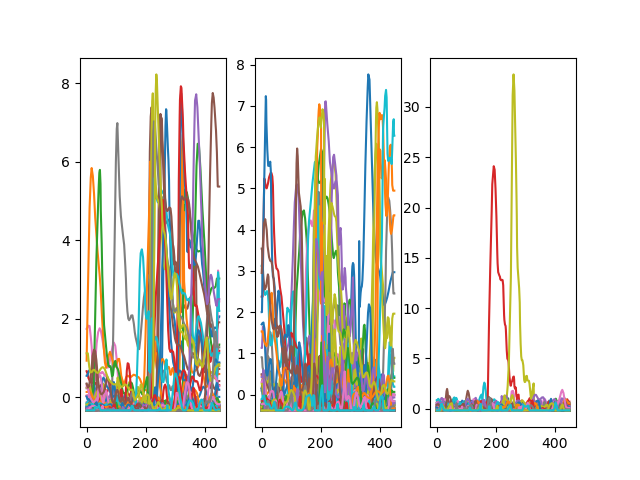

In [71]:
fig, axs = plt.subplots(ncols = 3)
for cell, ax in zip([0, 10, 50], axs.ravel()):
    for trial in neural_trials[:,:,cell]:
        ax.plot(trial)


In [67]:
neural_trials.shape

(80, 450, 616)

In [18]:
import scipy.stats as sts


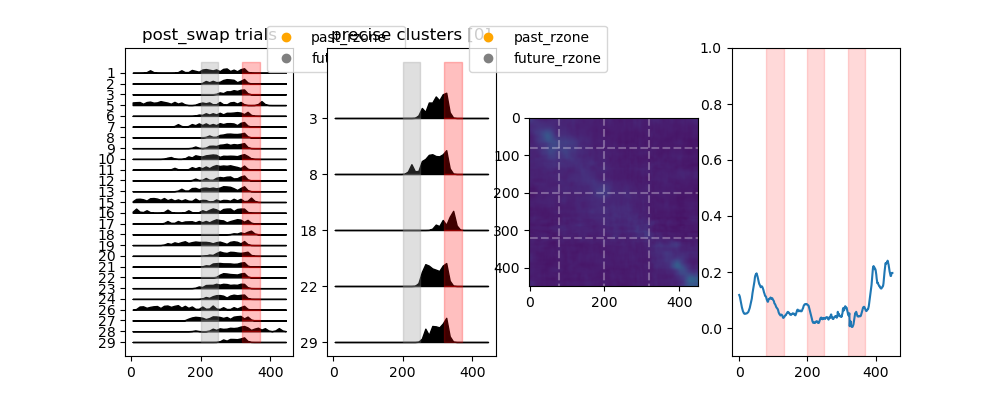

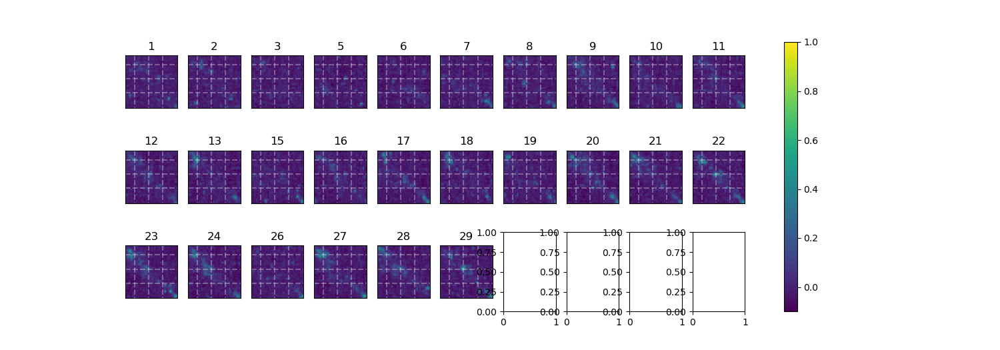

In [77]:
labels_for_mean = [0]
min_trial_for_mean = 0

#for plotting licks

compare_idxs = metadata.loc[(metadata.trial_type=='pre_swap')&(metadata.omit == False), 'idx'].values
compare_df = hd5_df.loc[hd5_df.idx.isin(compare_idxs).values]

#for plotting licks of mean PV
mean_idxs = metadata.loc[(metadata.hdb_labels.isin(labels_for_mean).values)&(metadata.trial>=min_trial_for_mean), 'idx'].values
mean_meta = hd5_df.loc[hd5_df.idx.isin(mean_idxs).values]
mean_licks = pf.get_data_trials_by_idx(licks, hd5_df, 
                                       mean_idxs)

licks = f[animal][day]['lick_data']['smoothed_licks'][:]
speeds = f[animal][day]['speed']['speed'][:]

compare_licks = pf.get_data_trials_by_idx(licks, hd5_df, compare_idxs)

neural_trials_raw = f[animal][day]['neural_events_trial_matrix'][:]
neural_trials = pf.tm_zscore(neural_trials_raw)


pearsons_arr = []
speed_arr = []


#mean pv will leave out the trial it is being compared to 
for compare_idx in compare_idxs:

    #leave this trial out of the mean calculation
    this_mean = [idx for idx in mean_idxs if not idx == compare_idx]

    this_trial_pv = pf.get_data_trials_by_idx(neural_trials, hd5_df, [compare_idx])
    mean_pv = pf.get_data_trials_by_idx(neural_trials, hd5_df, this_mean).mean(axis = 0)
    corr_mats, _ = pf.correlate_two_pop_vectors(mean_pv, this_trial_pv)

    #just take the comparison quadrant
    pearsons_arr +=[corr_mats[-1]]

    this_speed = pf.get_data_trials_by_idx(speeds, hd5_df, [compare_idx])
    speed_arr += [this_speed]

pearsons_arr = np.asarray(pearsons_arr)
speed_arr = np.asarray(speed_arr)


fig, rast_ax = plt.subplots(ncols = 4, figsize = (10,4))
ppf.plot_raster_from_licks(compare_licks, compare_df, rast_ax[0])
rast_ax[0].set_title('post_swap trials')
ppf.plot_raster_from_licks(mean_licks, mean_meta, rast_ax[1])
rast_ax[1].set_title(f'precise clusters {labels_for_mean}')


mean_pear = pearsons_arr.mean(axis = 0)
rast_ax[2].imshow(mean_pear, clim = (-0.1,1))
ppf.add_default_rzone_lines_to_matshow(rast_ax[2], alpha = 0.3)
rast_ax[3].plot( np.diag(mean_pear))
rast_ax[3].set_ylim((-0.1, 1))
for st in [80, 200, 320]:
    rast_ax[3].axvspan(st, st+50, color = 'red', alpha = 0.15)


all_diagonals = np.zeros((len(pearsons_arr), mean_pear.shape[-1]))

ncols = 10
nrows = int(np.ceil(len(pearsons_arr)/ncols))
fig, axs = plt.subplots(ncols = ncols, nrows = nrows, figsize = (1.5*ncols, 1.75*nrows))

i =0
for ax, pear, trial in zip(axs.ravel(), pearsons_arr, compare_df.trial):
    ppf.add_default_rzone_lines_to_matshow(ax, alpha = 0.3)
    im = ax.imshow(pear, clim = (-0.1, 1))
    ax.set_title(trial)
    ax.set_xticks(())
    ax.set_yticks(())
    all_diagonals[i] = np.diag(pear)
    i += 1
plt.colorbar(im, ax = axs)
fig.savefig('neural_pv_corrs.svg')


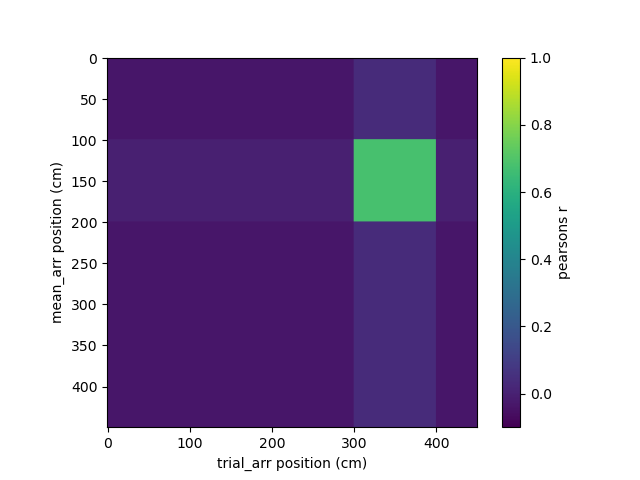

In [22]:
arr_1 = np.zeros((450, 500))
arr_2 = np.zeros((450, 500))

rng = np.random.default_rng(10)

pv2 = rng.random(500)

arr_1[:,:] = rng.random(500)
rng = np.random.default_rng(12)
arr_2[:,:] = rng.random(500)

arr_1[100:200,:] = pv2 
arr_2[300:400,:] = pv2 + rng.random(500)

corr_mats, _ = pf.correlate_two_pop_vectors(arr_1, arr_2)
fig, ax = plt.subplots()

ax.set_ylabel('mean_arr position (cm)')
ax.set_xlabel('trial_arr position (cm)')

im = ax.imshow(corr_mats[-1], clim = (-0.1, 1))
plt.colorbar(im, ax = ax, label = 'pearsons r')
fig.savefig('example_pearsons_cbar.svg')

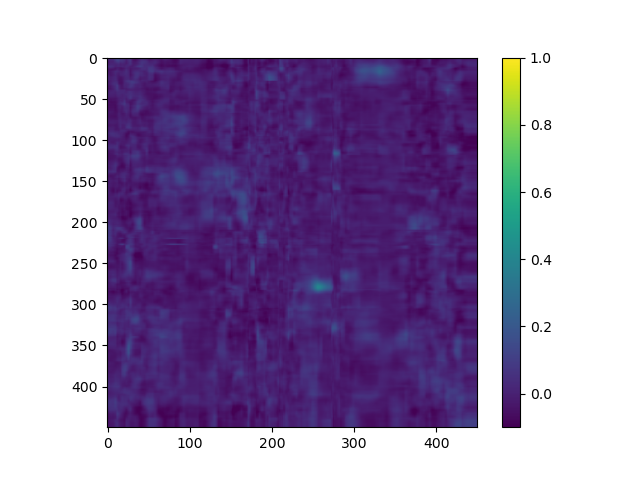

In [23]:
fig, ax = plt.subplots()
im = ax.imshow(pear, clim = (-0.1, 1))
plt.colorbar(im, ax = ax)


In [24]:


approach_old_zone = np.where((speed_bins_from_label>=150)&(speed_bins_from_label<200))
old_zone = np.where((speed_bins_from_label>=200)&(speed_bins_from_label<250))
approach_new_zone = np.where((speed_bins_from_label>=270)&(speed_bins_from_label<320))
new_zone = np.where((speed_bins_from_label>=320)&(speed_bins_from_label<370))



speed_corrs = np.zeros((len(compare_idxs), 5))
speed_diffs = np.zeros((len(compare_idxs), 5))

speed_arr = []

#mean pv will leave out the trial it is being compared to 
for i, compare_idx in enumerate(compare_idxs):

    #leave this trial out of the mean calculation
    this_mean = [idx for idx in mean_idxs if not idx == compare_idx]

    this_speed = pf.get_data_trials_by_idx(speeds, hd5_df, [compare_idx])
    speed_arr +=[this_speed]
    speed_mean = pf.get_data_trials_by_idx(speeds, hd5_df, this_mean).mean(axis = 0)
    speed_corrs[i,0] = np.corrcoef(speed_mean, this_speed)[0,1]
    speed_diffs[i,2] = np.mean(speed_mean[approach_new_zone] - this_speed[approach_new_zone])

    for j, zone in enumerate([approach_old_zone, approach_new_zone, old_zone, new_zone]):
        speed_corrs[i,j+1] = np.corrcoef(speed_mean[zone], this_speed[zone])[0,1]
        speed_diffs[i,j+1] = np.mean(this_speed[zone] -speed_mean[zone]  )

speed_arr = np.asarray(speed_arr)
    

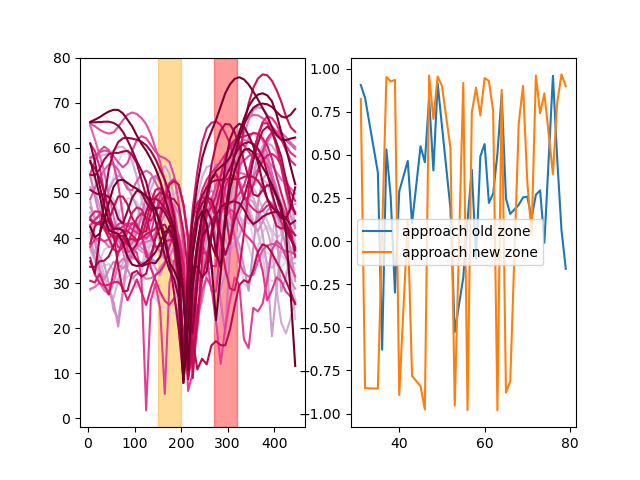

In [25]:
cmap = cm.PuRd(np.linspace(0.15, 1, len(all_diagonals)+1 ))
fig, axs = plt.subplots(ncols = 2)
for i, trial in enumerate(speed_arr):
    axs[0].plot(speed_bins_from_label, trial, color = cmap[i])

axs[0].axvspan(xmin = 150, xmax = 200, color = 'orange', alpha = 0.4, label = 'approach old zone')
axs[0].axvspan(xmin = 270, xmax = 320, color = 'red', alpha = 0.4, label = 'approach new zone')

# means = [np.median(trial[30:80]) for trial in all_diagonals]

# axs[1].plot(hd5_df_from_label.trial, means, label = 'approach extra zone')


all_zones, old_zone_dat, new_zone_dat = speed_corrs[:, 0],  speed_corrs[:, 1],  speed_corrs[:, 2], 

axs[1].plot(compare_df.trial, old_zone_dat, label = 'approach old zone')


axs[1].plot(compare_df.trial, new_zone_dat, label = 'approach new zone')

axs[1].legend()


In [26]:
old_zone

(array([20, 21, 22, 23, 24]),)

Text(0.5, 1.0, 'speed difference within approach zone')

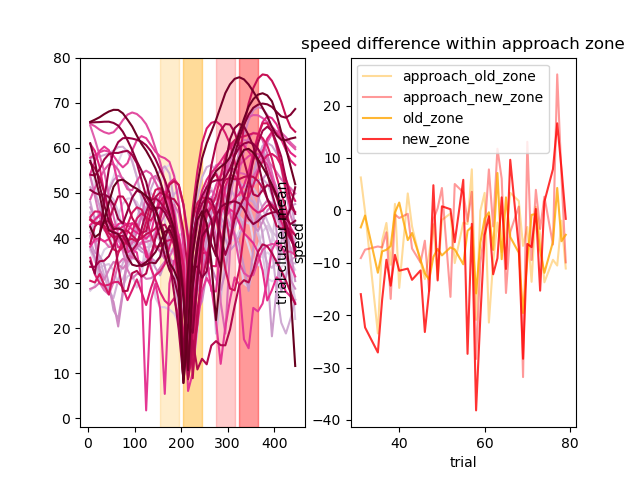

In [27]:


cmap = cm.PuRd(np.linspace(0.15, 1, len(all_diagonals) ))
fig, axs = plt.subplots(ncols = 2)
for i, trial in enumerate(speed_arr):
    axs[0].plot(speed_bins_from_label, trial, color = cmap[i])

for i, z in enumerate(zip([approach_old_zone, approach_new_zone, old_zone, new_zone], ['approach_old_zone', 'approach_new_zone', 'old_zone', 'new_zone'])):
    locs, name = z
    if 'approach' in name:
        alpha = 0.2
    else:
        alpha = 0.4

    if 'old' in name:
        color = 'orange'
    else:
        color = 'red'
    
    axs[0].axvspan(xmin = speed_bins_from_label[locs][0], 
                   xmax = speed_bins_from_label[locs][-1], 
                   color = color, alpha = alpha, label = name)

    axs[1].plot(compare_df.trial, speed_diffs[:,i+1], color = color, alpha = alpha*2, label = name)


# means = [np.median(trial[30:80]) for trial in all_diagonals]

# axs[1].plot(hd5_df_from_label.trial, means, label = 'approach extra zone')


axs[1].legend()

axs[1].set_xlabel('trial')
axs[1].set_ylabel('trial-cluster mean\nspeed')
axs[1].set_title('speed difference within approach zone')

Text(0.5, 0, 'position (cm)')

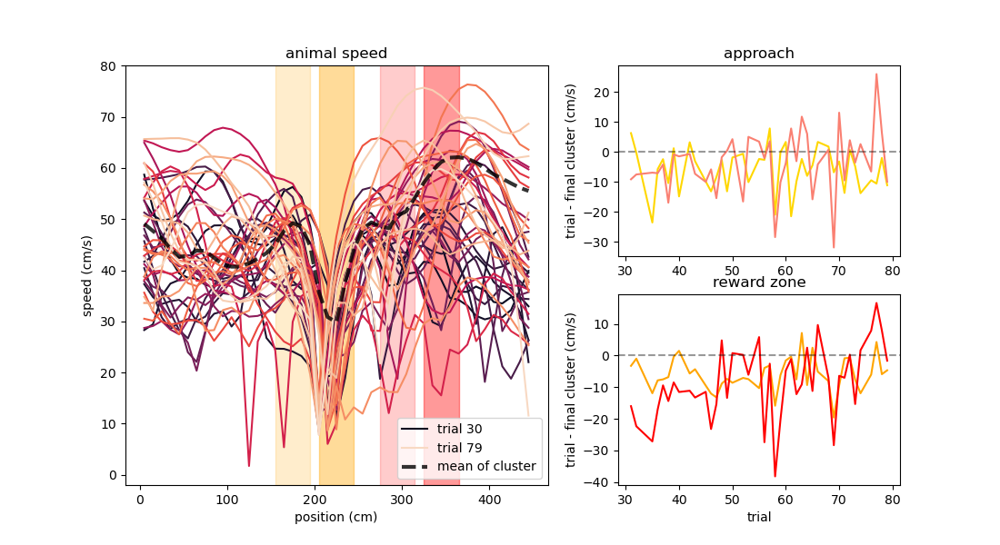

In [28]:

cmap = sns.color_palette("rocket", n_colors=len(all_diagonals))
# cmap = cm.PuRd(np.linspace(0.15, 1, len(all_diagonals) ))
fig = plt.figure(figsize = (11, 6))
ax_dict = fig.subplot_mosaic([['speed', 'approach'],
                                ['speed', 'reward_zone'],
                                    ],
                                height_ratios = [2.0,2.0],
                                width_ratios = [3.0,2.0])
for i, trial in enumerate(speed_arr[:-2]):
    if i == 0:
        ax_dict['speed'].plot(speed_bins_from_label, trial, color = cmap[i], label = 'trial 30')
    else:
        ax_dict['speed'].plot(speed_bins_from_label, trial, color = cmap[i])
        
trial = speed_arr[-1]
ax_dict['speed'].plot(speed_bins_from_label, trial, color = cmap[i+1], label = 'trial 79')


speeds_from_label = pf.get_data_trials_by_idx(speeds, hd5_df, mean_idxs)

ax_dict['speed'].plot(speed_bins_from_label, speeds_from_label.mean(axis = 0), color = 'black', linestyle = '--', alpha = 0.8, linewidth = 3,label = 'mean of cluster')
ax_dict['speed'].legend()

for i, z in enumerate(zip([approach_old_zone, approach_new_zone, old_zone, new_zone], ['approach_old_zone', 'approach_new_zone', 'old_zone', 'new_zone'])):
    locs, name = z
    if 'approach' in name:
        alpha = 0.2
    else:
        alpha = 0.4

    if 'old' in name:
        color = 'orange'
    else:
        color = 'red'
    
    ax_dict['speed'].axvspan(xmin = speed_bins_from_label[locs][0], 
                   xmax = speed_bins_from_label[locs][-1], 
                   color = color, alpha = alpha, label = name)

ax_dict['approach'].plot(compare_df.trial, speed_diffs[:,1], color = 'gold',label = 'old zone')
ax_dict['approach'].plot(compare_df.trial, speed_diffs[:,2], color = 'salmon',label = 'new zone')

ax_dict['reward_zone'].plot(compare_df.trial, speed_diffs[:,3], color = 'orange',label = 'old zone')
ax_dict['reward_zone'].plot(compare_df.trial, speed_diffs[:,4], color = 'red',label = 'new zone')

ax_dict['reward_zone'].axhline(y = 0, linestyle = '--', color = 'black', alpha = 0.4)
ax_dict['approach'].axhline(y = 0, linestyle = '--', color = 'black', alpha = 0.4)


ax_dict['reward_zone'].set_title('reward zone')
ax_dict['approach'].set_title('approach')
ax_dict['reward_zone'].set_xlabel('trial')
ax_dict['reward_zone'].set_xlabel('trial')
ax_dict['reward_zone'].set_ylabel('trial - final cluster (cm/s)')
ax_dict['approach'].set_ylabel('trial - final cluster (cm/s)')

ax_dict['speed'].set_title('animal speed')
ax_dict['speed'].set_ylabel('speed (cm/s)')
ax_dict['speed'].set_xlabel('position (cm)')


# fig.savefig('rocket_cbar.svg')
# means = [np.median(trial[30:80]) for trial in all_diagonals]

# axs[1].plot(hd5_df_from_label.trial, means, label = 'approach extra zone')


# axs[1].legend()

# axs[1].set_xlabel('trial')
# axs[1].set_ylabel('trial-cluster mean\nspeed')
# axs[1].set_title('speed difference within approach zone')

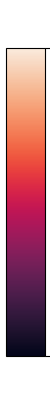

In [29]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import seaborn as sns

cmap = sns.color_palette("rocket", as_cmap=True)   # any continuous seaborn palette
vmin, vmax = 29, 79                              # your data range

fig, ax = plt.subplots(figsize=(0.5, 4))           # tall + narrow for vertical
cb = fig.colorbar(
    ScalarMappable(norm=Normalize(vmin, vmax), cmap=cmap),
    cax=ax,
    orientation="vertical",
    ticks=[vmin, vmax],                            # only the two ends
)
cb.set_ticks([29, 79])             # your custom end labels

fig.savefig("colorbar.svg", bbox_inches="tight")

In [30]:
import seaborn as sns

In [31]:
cmap = sns.color_palette("flare", n_colors=len(all_diagonals))
cmap

[(0.9274375, 0.66607098, 0.48996097),
 (0.92539502, 0.64345456, 0.47594352),
 (0.9231622, 0.6207962, 0.46202524),
 (0.92077582, 0.59804722, 0.44818634),
 (0.91825103, 0.57516584, 0.43441436),
 (0.9155979, 0.55210684, 0.42070204),
 (0.91262605, 0.52893336, 0.40749715),
 (0.90921368, 0.5056543, 0.39544411),
 (0.90529624, 0.48228017, 0.38472641),
 (0.90077904, 0.45884905, 0.37556121),
 (0.89458871, 0.4315354, 0.36715654),
 (0.888292, 0.40830288, 0.36223756),
 (0.880851, 0.38546632, 0.35970244),
 (0.87199254, 0.3633634, 0.35974223),
 (0.86145909, 0.3424046, 0.36234402),
 (0.84916723, 0.32289973, 0.36711424),
 (0.83520234, 0.30499724, 0.37346726),
 (0.81942908, 0.28911553, 0.38102921),
 (0.80185613, 0.2755178, 0.38925253),
 (0.7826624, 0.26420493, 0.39754146),
 (0.75861834, 0.25356035, 0.40663694),
 (0.73695678, 0.24620072, 0.41357737),
 (0.71463236, 0.24004289, 0.41956983),
 (0.69226314, 0.23413578, 0.42480327),
 (0.67004287, 0.22817117, 0.42938576),
 (0.64795375, 0.22217149, 0.43330852),
 (0.62597451, 0.21616235, 0.43656529),
 (0.60407977, 0.21017746, 0.43913439),
 (0.5822395, 0.20425693, 0.44098758),
 (0.56041794, 0.19845221, 0.44207535),
 (0.5385549, 0.19285696, 0.44229959),
 (0.51278481, 0.18693492, 0.44112605),
 (0.49052472, 0.18228477, 0.43887255),
 (0.46818879, 0.17788392, 0.43552047),
 (0.44584668, 0.17360625, 0.43114133),
 (0.42355299, 0.16934709, 0.42581586),
 (0.401357, 0.16501079, 0.41963528),
 (0.37928736, 0.16052483, 0.41270599),
 (0.35748213, 0.15559861, 0.40552633),
 (0.33604378, 0.15006017, 0.39835754),
 (0.31494974, 0.14391333, 0.39127626)]

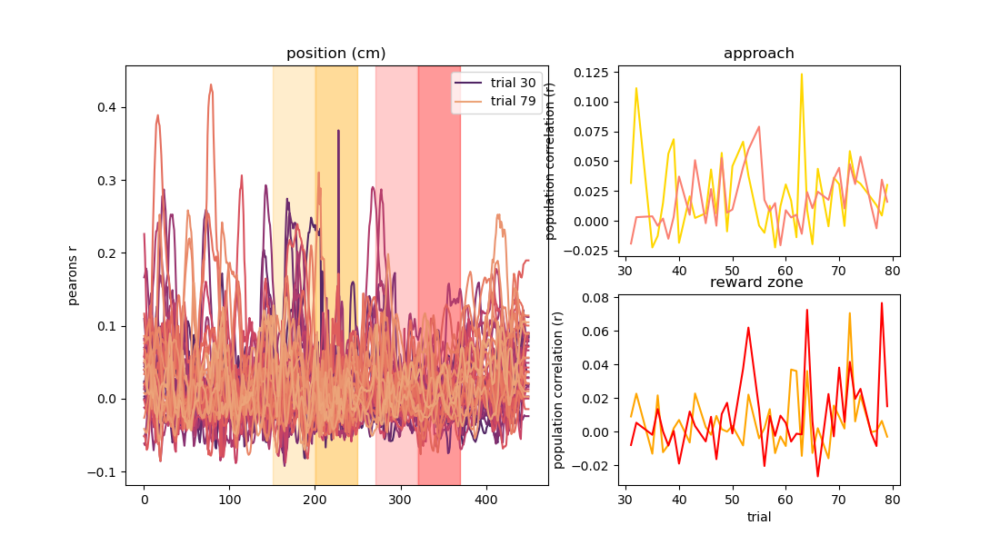

In [32]:
neural_bin_centers = np.arange(0.5, 450.5, 1)
neural_approach_old_zone = np.where((neural_bin_centers>=150)&(neural_bin_centers<200))[0]
neural_old_zone = np.where((neural_bin_centers>=200)&(neural_bin_centers<250))[0]
neural_approach_new_zone = np.where((neural_bin_centers>=270)&(neural_bin_centers<320))[0]
neural_new_zone = np.where((neural_bin_centers>=320)&(neural_bin_centers<370))[0]


cmap =  sns.color_palette("flare_r", n_colors=len(all_diagonals))
fig = plt.figure(figsize = (11, 6))
ax_dict = fig.subplot_mosaic([['pears', 'approach'],
                                ['pears', 'reward_zone'],
                                    ],
                                height_ratios = [2.0,2.0],
                                width_ratios = [3.0,2.0])
for i, trial in enumerate(all_diagonals[:-2]):
    if i == 0:
        ax_dict['pears'].plot(neural_bin_centers, trial, color = cmap[i], label = 'trial 30')
    else:
        ax_dict['pears'].plot(neural_bin_centers, trial, color = cmap[i])
    
trial = all_diagonals[-1]
ax_dict['pears'].plot(neural_bin_centers, trial, color = cmap[i+1], label = 'trial 79')
ax_dict['pears'].legend()

for i, z in enumerate(zip([neural_approach_old_zone, neural_approach_new_zone, neural_old_zone, neural_new_zone], ['approach_old_zone', 'approach_new_zone', 'old_zone', 'new_zone'])):
    locs, name = z
    if 'approach' in name:
        alpha = 0.2
    else:
        alpha = 0.4

    if 'old' in name:
        color = 'orange'
    else:
        color = 'red'
    
    ax_dict['pears'].axvspan(xmin = neural_bin_centers[locs][0], 
                   xmax = neural_bin_centers[locs][-1], 
                   color = color, alpha = alpha, label = name)
    



ax_dict['approach'].plot(compare_df.trial, np.mean(all_diagonals[:,neural_approach_old_zone], axis = 1), color = 'gold',label = 'old zone')
ax_dict['approach'].plot(compare_df.trial, np.mean(all_diagonals[:,neural_approach_new_zone], axis = 1), color = 'salmon',label = 'new zone')

ax_dict['reward_zone'].plot(compare_df.trial, np.mean(all_diagonals[:,neural_old_zone], axis = 1), color = 'orange',label = 'old zone')
ax_dict['reward_zone'].plot(compare_df.trial, np.mean(all_diagonals[:,neural_new_zone], axis = 1), color = 'red',label = 'new zone')



ax_dict['reward_zone'].set_title('reward zone ')
ax_dict['approach'].set_title('approach')
ax_dict['reward_zone'].set_xlabel('trial')
ax_dict['reward_zone'].set_xlabel('trial')
ax_dict['reward_zone'].set_ylabel('population correlation (r)')
ax_dict['approach'].set_ylabel('population correlation (r)')

ax_dict['pears'].set_title('population vector correlation versus good cluster mean')
ax_dict['pears'].set_ylabel('pearons r')
ax_dict['pears'].set_title('position (cm)')

fig.savefig('pearsons_vs_position_flare.svg')
# means = [np.median(trial[30:80]) for trial in all_diagonals]

# axs[1].plot(hd5_df_from_label.trial, means, label = 'approach extra zone')


# axs[1].legend()

# axs[1].set_xlabel('trial')
# axs[1].set_ylabel('trial-cluster mean\nspeed')
# axs[1].set_title('speed difference within approach zone')

In [33]:
all_diagonals.shape

(41, 450)

In [34]:
neural_approach_old_zone[0]

150

In [35]:
all_diagonals[:,neural_approach_old_zone[0]].shape

(41,)

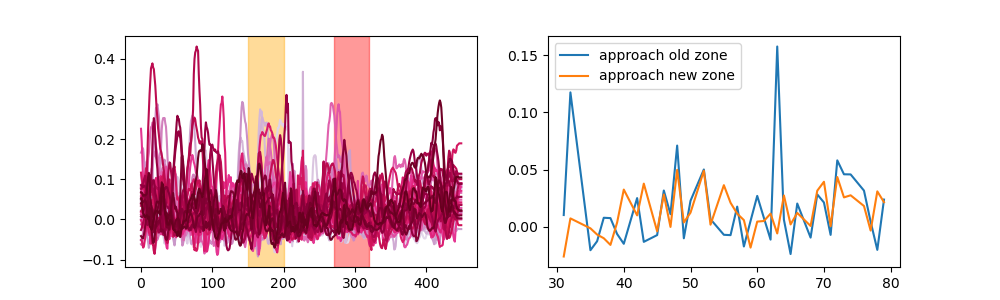

In [36]:
cmap = cm.PuRd(np.linspace(0.15, 1, len(all_diagonals) ))
fig, axs = plt.subplots(ncols = 2, figsize = (10,3))
for i, trial in enumerate(all_diagonals):
    axs[0].plot(trial, color = cmap[i])
axs[0].axvspan(xmin = 150, xmax = 200, color = 'orange', alpha = 0.4, label = 'approach old zone')
axs[0].axvspan(xmin = 270, xmax = 320, color = 'red', alpha = 0.4, label = 'approach new zone')
# means = [np.median(trial[30:80]) for trial in all_diagonals]

# axs[1].plot(hd5_df_from_label.trial, means, label = 'approach extra zone')

means = [np.median(t[150:200]) for t in all_diagonals]

axs[1].plot(compare_df.trial, means, label = 'approach old zone')

means = [np.median(t[270:320]) for t in all_diagonals]
axs[1].plot(compare_df.trial, means, label = 'approach new zone')

axs[1].legend()

In [37]:
neural_trials.shape

(80, 450, 616)

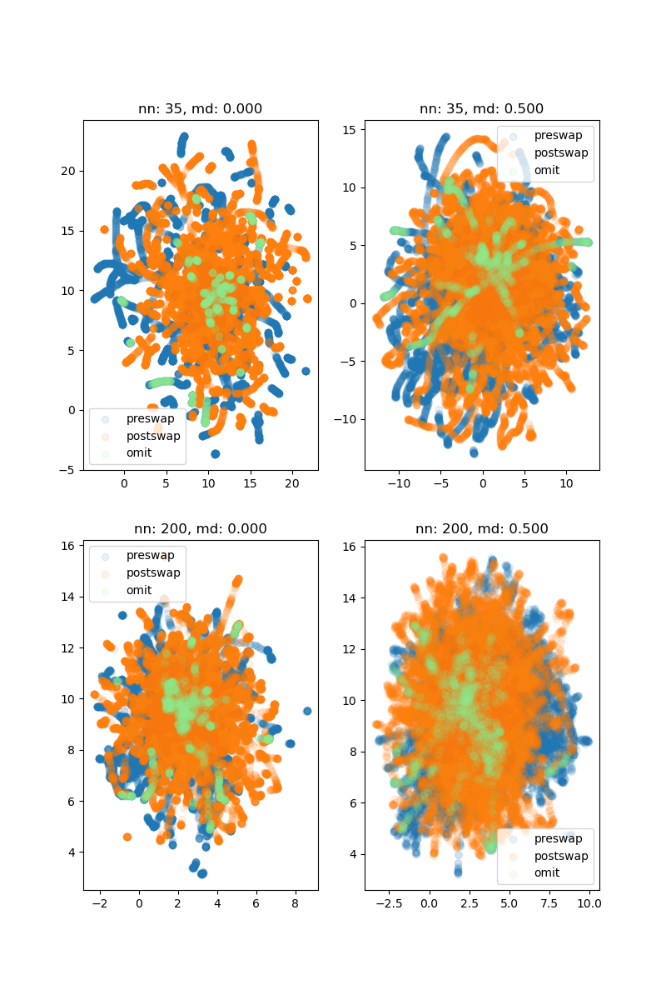

In [74]:
n_rows = 2
n_cols = 2

fig, axs = plt.subplots(ncols = n_cols, nrows = n_rows, figsize = (n_rows*4,ncols*4))
neural_trials_reshaped = neural_trials.reshape(neural_trials.shape[0]*neural_trials.shape[1], neural_trials.shape[-1])
n_preswap = sum(hd5_df.trial_type == 'pre_swap')
n_postswap = sum(hd5_df.trial_type == 'post_swap')

for i, n_neighbor in enumerate(np.linspace(35, 200, n_rows)):
    for j, min_dist in enumerate(np.linspace(0, 0.5, n_cols)):
        
        reducer = umap.UMAP(n_neighbors=int(n_neighbor), min_dist=min_dist)
        
        embedding = reducer.fit_transform(neural_trials_reshaped)

        pre_trials = embedding[:n_preswap*neural_trials.shape[1]]
        post = embedding[n_preswap*neural_trials.shape[1]:]

        axs[i,j].scatter(pre_trials[:,0], pre_trials[:,1], alpha = 0.1, label = 'preswap')
        axs[i,j].scatter(post[:,0], post[:,1], alpha = 0.1, label = 'postswap')

        omission = np.zeros((embedding.shape[0]), dtype = bool)
        for trial in hd5_df.loc[hd5_df.omit == True, 'trial'].values:
            omission[int(trial*neural_trials.shape[0]):int(trial*neural_trials.shape[0] + neural_trials.shape[0])] = 1

        axs[i,j].scatter(embedding[omission, 0], embedding[omission, 1], color = 'lightgreen', label = 'omit', alpha = 0.1)
        axs[i,j].legend()
        axs[i,j].set_title(f'nn: {int(n_neighbor)}, md: {min_dist:.3f}')

In [39]:
neural_trials_reshaped = neural_trials.reshape(neural_trials.shape[0]*neural_trials.shape[1], neural_trials.shape[-1])

In [40]:
neural_reducer = umap.UMAP(n_neighbors=100, min_dist=0.0)
        
neural_embedding = neural_reducer.fit_transform(neural_trials_reshaped)

In [41]:
neural_bin_centers = np.arange(0.5, 450.5, 1)
def trial_df_to_position_df(df, bin_centers):
    expanded = df.loc[df.index.repeat(len(bin_centers))]
    expanded["position"] = np.tile(bin_centers, len(df))
    return expanded



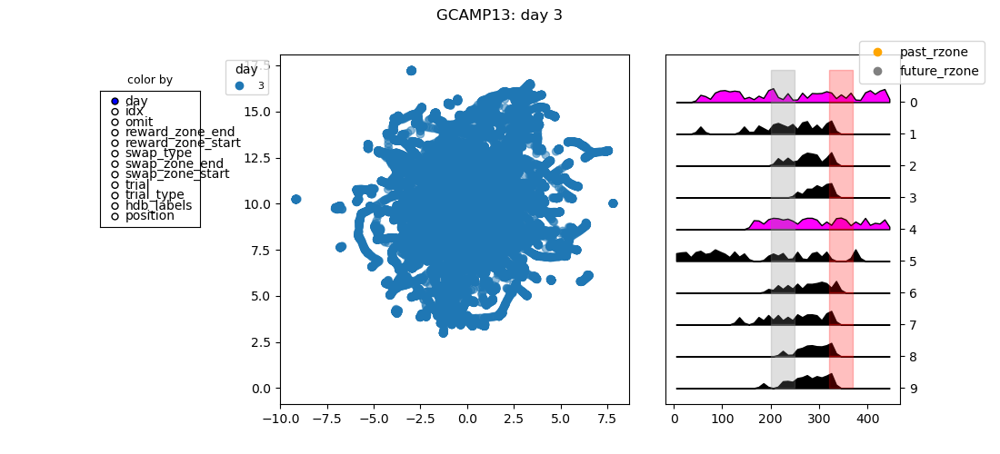

KeyError: 'position'

In [83]:
scatter_meta = trial_df_to_position_df(metadata, neural_bin_centers)
scatter_data = neural_embedding
linker = TrialPlotLinker(scatter_meta)
raster_data = sorted_licks

bin_centers = f[animal][day]['lick_data']['bin_center']

fig = plt.figure(figsize = (11,5))
fig.suptitle(f'{animal}: day {day}')
axes_dict = fig.subplot_mosaic([['lick_umap', 'lick_umap', 'lick_raster'],
                                    ['lick_umap','lick_umap', 'lick_raster'],
                                    ],
                                height_ratios = [3.0,2.0],
                                width_ratios = [2.0,2.0,3])

ax_umap= axes_dict['lick_umap']




scatter_1 = ax_umap.scatter(scatter_data[:,0], scatter_data[:,1], alpha = 0.5, label = 'preswap')

ax_umap.legend()


add_hover(scatter_1, scatter_meta)
color_selector = ColorSelectorV2(scatter_1,scatter_meta)

sel = add_selectors(scatter_1, linker, scatter_meta)


umap_view = ppf.ScatterView(data = transform, meta = scatter_meta, plt_obj = scatter_1)


lick_ax = axes_dict['lick_raster']
lick_ax.tick_params(right=True, labelright=True, left=False, labelleft=False)

raster_view = ppf.LickRasterView(raster_data, bin_centers, metadata, lick_ax)
raster_view.link_colormaps(color_selector.get_color_linker(), )
# raster_view.sort_by({'hdb_labels':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
# raster_view.sort_by({'hdb_labels':'descending', 'reward_zone_start':'descending','day':'descending', 'trial':'ascending'})
color_selector.add_after_recolor_call(raster_view.update_linked_colors)

linker.add_views([umap_view, raster_view]) 
# raster_view.update(start_idx)
# umap_view.update(start_idx)

In [ ]:
pf = importlib.reload(pf)
r_loc = pf.get_unique_reward_zones_from_meta(hd5_df)

neural_trials_raw = f[animal][day]['neural_events_trial_matrix'][:]
neural_trials = pf.tm_zscore(neural_trials_raw)

r_zone_length = int(r_loc[0][1]- r_loc[0][0])
r_zone_cmap = plt.cm.Reds_r(np.linspace(0, 1, 2*(r_zone_length)))

pos_n_bins = neural_trials.shape[1]
n_trials = neural_trials.shape[0]
position = np.asarray([i for i in range(pos_n_bins)]*n_trials)
position[:n_trials*pos_n_bins].shape
cmap = plt.cm.plasma(np.linspace(0, 1, pos_n_bins))
cmap2 = plt.cm.plasma(np.linspace(0, 1, pos_n_bins))

cmap[r_loc[0][0]:r_loc[0][1],:] = r_zone_cmap[:r_zone_length,:]
color_1 = np.asarray([cmap[x%pos_n_bins] for x in position[:n_trials*pos_n_bins]])

cmap2[r_loc[1][0]:r_loc[1][1],:] = r_zone_cmap[:r_zone_length,:]
color_2 = np.asarray([cmap[x%pos_n_bins] for x in position[:n_trials*pos_n_bins]])


c_r1 = [cmap[x] for x in range(len(neural_bin_centers))]
c_r2 = [cmap2[x] for x in range(len(neural_bin_centers))]

In [44]:
r_loc

array([[320, 370],
       [200, 250]])

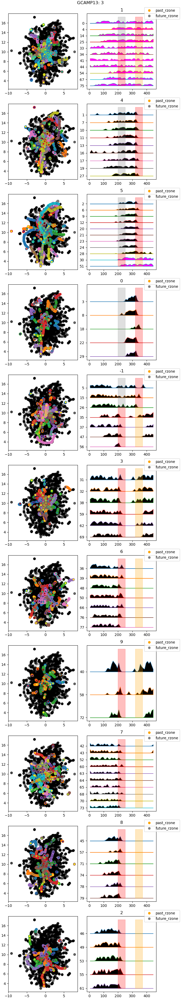

In [81]:
scatter_meta = trial_df_to_position_df(metadata, neural_bin_centers)
n_labels = len(scatter_meta.hdb_labels.unique())
fig, axs = plt.subplots(nrows = n_labels, ncols = 2, figsize = (7, 3.5*n_labels),layout="constrained")

c_r1 = [cmap[x] for x in range(len(neural_bin_centers))]
c_r2 = [cmap2[x] for x in range(len(neural_bin_centers))]

trial_cmap = sns.color_palette("tab10", as_cmap = True)

for i, label in enumerate(scatter_meta.hdb_labels.unique()):
    dat = neural_embedding[scatter_meta.hdb_labels == label]
    dat_n = neural_embedding[scatter_meta.hdb_labels != label]
    axs[i,0].scatter(dat_n[:,0], dat_n[:,1], alpha = 0.05, color = 'black')

    compare_idxs = metadata.loc[(metadata.hdb_labels==label), 'idx'].values
    compare_meta = metadata.loc[(metadata.hdb_labels==label)]

    compare_licks = pf.get_data_trials_by_idx(licks, hd5_df, compare_idxs)

    trial_type_bool = compare_meta.trial_type=='pre_swap'

    linker = ppf.ColorLinker('trial')
    categorical_cmap = {unique:trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)} #keep this to pass to other plot objects
    linker.set_categorical(categorical_cmap, 'trial')
    
    if len(compare_meta) == 1:
        compare_licks = [compare_licks]
    v = ppf.plot_raster_from_licks(compare_licks, 
                       compare_meta,ax = axs[i,1], edge_colorby = 'trial', edgecm = linker)

    
    

    c = []

    for t in trial_type_bool:
        if t:
            c+=c_r1
        else:
            c+=c_r2

    trial_colors = [trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)]
    
    facecolors = []
    for color, _ in zip(trial_colors, range(len(compare_meta))):
        facecolors += [color]*len(neural_bin_centers)

    axs[i,0].scatter(dat[:,0], dat[:,1], facecolor= c, edgecolor = facecolors)

    axs[i,1].set_title(label)


    
    

    fig.suptitle(f'{animal}: {day}')


In [46]:
r_loc = pf.get_unique_reward_zones_from_meta(hd5_df)

neural_trials_raw = f[animal][day]['neural_events_trial_matrix'][:]
neural_trials = pf.tm_zscore(neural_trials_raw)

r_zone_length = int(r_loc[0][1]- r_loc[0][0])
r_zone_cmap = plt.cm.Reds_r(np.linspace(0, 1, 2*(r_zone_length)))

pos_n_bins = neural_trials.shape[1]
n_trials = neural_trials.shape[0]
position = np.asarray([i for i in range(pos_n_bins)]*n_trials)
position[:n_trials*pos_n_bins].shape
cmap = plt.cm.viridis(np.linspace(0, 1, pos_n_bins))
cmap2 = plt.cm.viridis(np.linspace(0, 1, pos_n_bins))

cmap[r_loc[0][0]:r_loc[0][1],:] = r_zone_cmap[:r_zone_length,:]
color_1 = np.asarray([cmap[x%pos_n_bins] for x in position[:n_trials*pos_n_bins]])

cmap2[r_loc[1][0]:r_loc[1][1],:] = r_zone_cmap[:r_zone_length,:]
color_2 = np.asarray([cmap[x%pos_n_bins] for x in position[:n_trials*pos_n_bins]])

Text(0.5, 0.98, 'GCAMP13: 3')

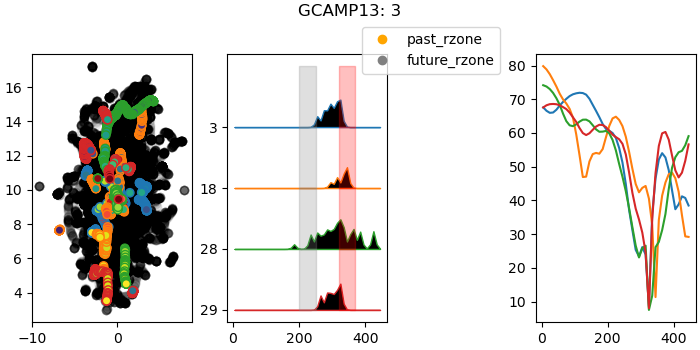

In [82]:
scatter_meta = trial_df_to_position_df(metadata, neural_bin_centers)
# n_labels = len(scatter_meta.hdb_labels.unique())
n_labels = 1
fig, axs = plt.subplots(nrows = n_labels, ncols = 3, figsize = (7, 3.5*n_labels),layout="constrained")

c_r1 = [cmap[x] for x in range(len(neural_bin_centers))]
c_r2 = [cmap2[x] for x in range(len(neural_bin_centers))]

trial_cmap = sns.color_palette("tab10", as_cmap = True)


trials = [3,18,28, 29]

dat = neural_embedding[scatter_meta.trial.isin(trials).values]
dat_n = neural_embedding[~scatter_meta.trial.isin(trials).values]
axs[0].scatter(dat_n[:,0], dat_n[:,1], alpha = 0.05, color = 'black')

compare_idxs = metadata.loc[metadata.trial.isin(trials).values, 'idx'].values
compare_meta = metadata.loc[metadata.trial.isin(trials).values]

compare_licks = pf.get_data_trials_by_idx(licks, hd5_df, compare_idxs)

trial_type_bool = compare_meta.trial_type=='pre_swap'

linker = ppf.ColorLinker('trial')
categorical_cmap = {unique:trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)} #keep this to pass to other plot objects
linker.set_categorical(categorical_cmap, 'trial')


v = ppf.plot_raster_from_licks(compare_licks, 
                    compare_meta,ax = axs[1], edge_colorby = 'trial', edgecm = linker)






c = []

for t in trial_type_bool:
    if t:
        c+=c_r1
    else:
        c+=c_r2

trial_colors = [trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)]

facecolors = []
for color, _ in zip(trial_colors, range(len(compare_meta))):
    facecolors += [color]*len(neural_bin_centers)

axs[0].scatter(dat[:,0], dat[:,1], facecolor= c, edgecolor = facecolors)

speeds_from_label = pf.get_data_trials_by_idx(speeds, hd5_df, compare_idxs)

for i, trial in enumerate(speeds_from_label):
    axs[-1].plot(speed_bins_from_label, trial, color = trial_colors[i])

    
    

fig.suptitle(f'{animal}: {day}')


In [48]:
compare_meta

,day,idx,omit,reward_zone_end,reward_zone_start,swap_type,swap_zone_end,swap_zone_start,trial,trial_type,hdb_labels
28,3,GCAMP13_3_28,False,370,320,swap_proximal,250.0,200.0,28,pre_swap,5
29,3,GCAMP13_3_29,False,370,320,swap_proximal,250.0,200.0,29,pre_swap,0
69,3,GCAMP13_3_69,False,250,200,swap_proximal,370.0,320.0,69,post_swap,3
71,3,GCAMP13_3_71,False,250,200,swap_proximal,370.0,320.0,71,post_swap,8


/tmp/ipykernel_12176/1898517958.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows = n_labels, ncols = 2, figsize = (9, 3.5*n_labels),layout="constrained")


Text(0.5, 0.98, 'GCAMP13: 3')

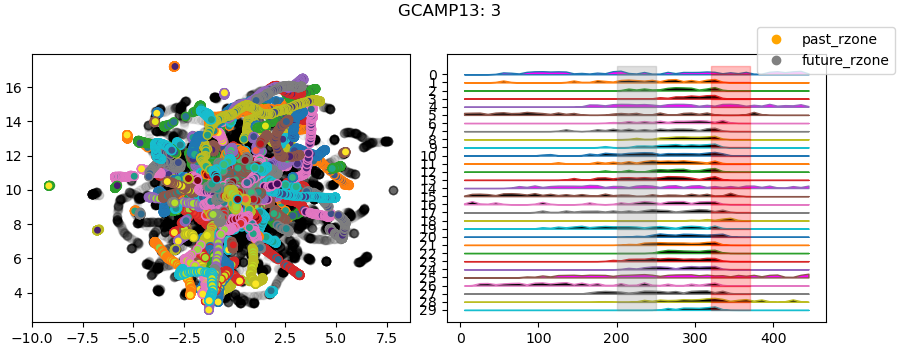

In [49]:
scatter_meta = trial_df_to_position_df(metadata, neural_bin_centers)
# n_labels = len(scatter_meta.hdb_labels.unique())
n_labels = 1
fig, axs = plt.subplots(nrows = n_labels, ncols = 2, figsize = (9, 3.5*n_labels),layout="constrained")

c_r1 = [cmap[x] for x in range(len(neural_bin_centers))]
c_r2 = [cmap2[x] for x in range(len(neural_bin_centers))]

trial_cmap = sns.color_palette("tab10", as_cmap = True)

trials = [i for i in range(0, 30, 1)]


dat = neural_embedding[scatter_meta.trial.isin(trials).values]
dat_n = neural_embedding[~scatter_meta.trial.isin(trials).values]
axs[0].scatter(dat_n[:,0], dat_n[:,1], alpha = 0.05, color = 'black')

compare_idxs = metadata.loc[metadata.trial.isin(trials).values, 'idx'].values
compare_meta = metadata.loc[metadata.trial.isin(trials).values]

compare_licks = pf.get_data_trials_by_idx(licks, hd5_df, compare_idxs)

trial_type_bool = compare_meta.trial_type=='pre_swap'

linker = ppf.ColorLinker('trial')
categorical_cmap = {unique:trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)} #keep this to pass to other plot objects
linker.set_categorical(categorical_cmap, 'trial')


v = ppf.plot_raster_from_licks(compare_licks, 
                    compare_meta,ax = axs[1], edge_colorby = 'trial', edgecm = linker)




c = []

for t in trial_type_bool:
    if t:
        c+=c_r1
    else:
        c+=c_r2

trial_colors = [trial_cmap(i % trial_cmap.N) for i, unique in enumerate(compare_meta.trial.values)]

facecolors = []
for color, _ in zip(trial_colors, range(len(compare_meta))):
    facecolors += [color]*len(neural_bin_centers)

axs[0].scatter(dat[:,0], dat[:,1], facecolor= c, edgecolor = facecolors)



    
    

fig.suptitle(f'{animal}: {day}')


In [50]:
v.edgecm

In [51]:
pos_ind = v.ids_to_positions(v.id_selection)

metadata_slicer = v.metadata.idx.isin(v.id_selection)
edge_vals = v.metadata.loc[metadata_slicer][v.edge_colorby].values

In [52]:
v.edgecm(edge_vals[0])

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)

In [53]:
pos_ind = v.ids_to_positions(v.id_selection)

metadata_slicer = v.metadata.idx.isin(v.id_selection)
face_vals = v.metadata.loc[metadata_slicer][v.colorby].values.astype(float)

In [54]:
for fv in face_vals:
    print(v.colormap(fv))

(1.0, 0.0, 1.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(1.0, 0.0, 1.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(1.0, 0.0, 1.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(1.0, 0.0, 1.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 1.0)


In [55]:
type(v.colormap)

matplotlib.colors.LinearSegmentedColormap

In [56]:
compare_licks.shape

(30, 45)